# LIBRARIES

In [2]:
# data are in my personal google drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# installing not preinstalled libraries

!pip install -q bnlearn #-q to print less output

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.1/103.1 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 6.8 MB/s eta 0:00:00


In [4]:
# importing necessary libraries that will be used during the project

import os
import zipfile
import logging
import numpy as np
import pandas as pd
import bnlearn as bn
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox

# DATA PREPROCESSING

In [ ]:
# creating one csv (about 10 mins) -> to do once

'''

data_folder = "/content/drive/MyDrive/Data"

data_path = '/content/drive/My Drive/Data/full_data.csv'

useful_columns = ['Date', 'ShortName', 'Sector', 'Region',
                  'Currency', 'RunningCoupon',
                  'PrimaryCoupon', 'Tenor', 'ConvSpread']

first_file = True #as RAM of Colab is not enough, we implement an "incremental" approach

for folder in os.listdir(data_folder):

  if folder.startswith("OneDrive"):

    year_folder = os.path.join(data_folder, folder)
    print(f"Folder: {year_folder}")

    for zipped_folder in os.listdir(year_folder):

      day_folder = os.path.join(year_folder, zipped_folder)
      print(f"Zipped folder: {day_folder}")

      with zipfile.ZipFile(day_folder, 'r') as zip_ref:

        csv = zip_ref.namelist()[0]
        print(f"Csv: {csv}")

        with zip_ref.open(csv) as data:

          chunk = pd.read_csv(data)

          chunk = chunk[useful_columns]

          # I choose to work with European Banks (EU+UK+Switzerland) with the most liquid Tenor -> SE ESCLUDO E.EUR ESCLUDO HUN, ANCHE SE NON CI SONO GRANDI BANCHE
          chunk = chunk[(chunk['Sector'] == 'Financials') & (chunk['Region'] == 'Europe') & (chunk['Tenor'] == '5Y')] #TOLTO E.EUR, quindi 'RUS', 'KAZ', 'HUN', 'UKR'

          # now I can drop some columns
          chunk = chunk.drop(columns = ["Sector", "Region", "Tenor"])

          chunk.to_csv(data_path, mode = 'a', header = first_file, index = False)

          first_file = False
'''

In [ ]:
# resulting file

full_data = pd.read_csv("/content/drive/MyDrive/Data/full_data.csv")
full_data

,Date,ShortName,Currency,RunningCoupon,PrimaryCoupon,ConvSpread
0,2022-02-17,Bco SANTANDER SA,USD,0.01,Y,0.004554
1,2022-02-17,Bco SANTANDER SA,USD,0.05,N,0.004381
2,2022-02-17,Skandinaviska Enskilda Banken AB,EUR,0.01,Y,0.009065
3,2022-02-17,Skandinaviska Enskilda Banken AB,EUR,0.05,N,0.008817
4,2022-02-17,Cr Agricole SA,AUD,0.03,N,0.003088
...,...,...,...,...,...,...
1260169,2023-02-28,NatWest Markets NV,USD,0.05,N,0.004271
1260170,2023-02-28,Intesa Sanpaolo SpA,EUR,0.01,Y,0.009015
1260171,2023-02-28,Intesa Sanpaolo SpA,EUR,0.03,N,0.008889
1260172,2023-02-28,HSBC Hldgs plc,USD,0.05,N,0.007026


In [ ]:
# whick banks are in my data?

all_EU_banks = full_data.ShortName.unique()
all_EU_banks = sorted(all_EU_banks)
print(f"European banks in my data with at least a CDS with 5-yr Tenor: {all_EU_banks}")
print(f"Total european banks with at least a CDS with 5-yr Tenor: {len(all_EU_banks)}")

European banks in my data with at least a CDS with 5-yr Tenor: ['3i Gp plc', 'ABN AMRO Bk NV', 'ADLER Real Estate AG', 'ALGECO GLOB FIN PLC', 'ALPHA Bk AE', 'AXA', 'Aegon N.V.', 'Ageas Ins Intl NV', 'Alliance Leicester Ltd', 'Allianz SE', 'Allied Irish Bks PLC', 'Aroundtown SA', 'Assicurazioni Generali S p A', 'Aviva plc', 'BANKIA SA', 'BAWAG P.S.K', 'BNP Paribas', 'BNP Paribas Fortis', 'BPCE', 'Bankinter S A', 'Barclays Bk plc', 'Barclays PLC', 'Bay Landbk Giroz', 'Bca Carige Cas Di Risp Gen E Imp SpA', 'Bca Monte dei Paschi di Siena S p A', 'Bca Naz del Lavoro S p A', 'Bco BPI SA', 'Bco BPM S per Azioni', 'Bco Bilbao Vizcaya Argentaria S A', 'Bco Comercial Portugues SA', 'Bco SANTANDER SA', 'Bco de Sabadell S A', 'Bevco Lux Sa rl', 'Bk OF SCOTLAND PLC', 'Bqe Federative Du Cr Mutuel', 'Bqe Psa Fin', 'Brit Ld Co plc', 'CAISSE Cen DU Cr IMMOBILIER DE FRANCE', 'CAIXA GERAL DE DEPOSITOS SA', 'CARMILA', 'CIE de Financement Foncier', 'CITADEL Fin Ltd', 'CRITERIA CAIXA SA S UNIPERSONAL', 'Ca

In [ ]:
# https://www.spglobal.com/marketintelligence/en/news-insights/latest-news-headlines/europe-s-50-largest-banks-by-assets-2022-69689461 largest banks 2021, 2022
# La Banque Postal unavailable, Sberbank Russian

banks_sample = [
        'HSBC Hldgs plc',
        'BNP Paribas',
        'Cr Agricole SA',
        'Bco SANTANDER SA',
        'Barclays PLC',
        'Societe Generale',
        'UBS Group AG',
        'BPCE',
        'Deutsche Bk AG',
        'Bqe Federative Du Cr Mutuel',
        'Lloyds Bkg Group plc',
        'ING Groep NV',
        'Intesa Sanpaolo SpA',
        'NATWEST GROUP PLC',
        'UniCredit SpA',
        'Bco Bilbao Vizcaya Argentaria S A',
        'STANDARD CHARTERED PLC',
        'DZ Bk AG',
        'Cooeperatieve Rabobank UA',
        'CaixaBank SA',
        'Credit Suisse Gp AG',
        'Nordea Bk Abp',
        'Danske Bk A S',
        'Commerzbank AG',
        'ABN AMRO Bk NV',
        'KBC Group NV',
        'Nationwide Bldg Soc',
        'Svenska Handelsbanken AB']

bank_data = full_data[(full_data['ShortName'].isin(banks_sample))]
print(f"I considered {len(banks_sample)} banks")

I considered 28 banks


In [ ]:
# NAs or null values?
# printing types of the columns to see if there is anything to adjust

if bank_data.isnull().values.any():
    print("There are NAs or null values")
else:
    print("No problem with NAs or null values.")

print()

print("Types of my column:")
for col, dtype in bank_data.dtypes.items():
    print(f"Column: {col}, Type: {dtype}")

print()

print("Converting Date...")
bank_data.loc[:, 'Date'] = pd.to_datetime(bank_data['Date'])
print("Done!")

No problem with NAs or null values.

Types of my column:
Column: Date, Type: object
Column: ShortName, Type: object
Column: Currency, Type: object
Column: RunningCoupon, Type: float64
Column: PrimaryCoupon, Type: object
Column: ConvSpread, Type: float64

Converting Date...
Done!


In [ ]:
# do I have all the dates for each bank?

print("Number of days with data for each bank:")

for bank in banks_sample:
  print(f"Dates for bank {bank}:", len(bank_data[(bank_data['ShortName'] == bank)]['Date'].unique()))

Number of days with data for each bank:
Dates for bank HSBC Hldgs plc: 558
Dates for bank BNP Paribas: 558
Dates for bank Cr Agricole SA: 558
Dates for bank Bco SANTANDER SA: 558
Dates for bank Barclays PLC: 558
Dates for bank Societe Generale: 558
Dates for bank UBS Group AG: 558
Dates for bank BPCE: 53
Dates for bank Deutsche Bk AG: 558
Dates for bank Bqe Federative Du Cr Mutuel: 558
Dates for bank Lloyds Bkg Group plc: 558
Dates for bank ING Groep NV: 558
Dates for bank Intesa Sanpaolo SpA: 558
Dates for bank NATWEST GROUP PLC: 558
Dates for bank UniCredit SpA: 558
Dates for bank Bco Bilbao Vizcaya Argentaria S A: 558
Dates for bank STANDARD CHARTERED PLC: 558
Dates for bank DZ Bk AG: 558
Dates for bank Cooeperatieve Rabobank UA: 558
Dates for bank CaixaBank SA: 558
Dates for bank Credit Suisse Gp AG: 558
Dates for bank Nordea Bk Abp: 558
Dates for bank Danske Bk A S: 558
Dates for bank Commerzbank AG: 558
Dates for bank ABN AMRO Bk NV: 558
Dates for bank KBC Group NV: 75
Dates for 

In [ ]:
# which dates for the banks with fewer dates? Fixable or to discard?

print(f"Amount of available data for BPCE: {len(full_data[(full_data['ShortName'] == 'BPCE')]['Date'].unique())}")
print("First 3 dates:")
print(sorted(full_data[(full_data['ShortName'] == 'BPCE')]['Date'].unique())[:3])
print("To remove")

print()

print(f"Amount of available data for KBC Group NV: {len(full_data[(full_data['ShortName'] == 'KBC Group NV')]['Date'].unique())}")
print("First 3 dates:")
print(sorted(full_data[(full_data['ShortName'] == 'KBC Group NV')]['Date'].unique())[:3])
print("To remove")

print()

print(f"Amount of available data for Nationwide Bldg Soc: {len(full_data[(full_data['ShortName'] == 'Nationwide Bldg Soc')]['Date'].unique())}")
bank_full = set(full_data[(full_data['ShortName'] == 'DZ Bk AG')]['Date'].unique())
NBS_dates = set(full_data[(full_data['ShortName'] == 'Nationwide Bldg Soc')]['Date'].unique())
print("Date missing:")
print(bank_full-NBS_dates)
print("I can fix it later")

Amount of available data for BPCE: 53
First 3 dates:
['2022-12-16', '2022-12-19', '2022-12-20']
To remove

Amount of available data for KBC Group NV: 75
First 3 dates:
['2022-11-16', '2022-11-17', '2022-11-18']
To remove

Amount of available data for Nationwide Bldg Soc: 557
Date missing:
{'2022-09-05'}
I can fix it later


In [ ]:
# data distribution of PrimaryCoupon

full_data["PrimaryCoupon"].value_counts()

,count
PrimaryCoupon,
Y,630087
N,630087


In [ ]:
# how many data with a certain currency

full_data["Currency"].value_counts()

,count
Currency,
EUR,615726
USD,388372
GBP,120406
JPY,72162
CHF,30578
SEK,16778
AUD,9602
SGD,2084
HKD,2024


In [ ]:
# let's remove BPCE and KBC Group NV
# let's keep only PrimaryCoupon = 'Y', Currency = 'EUR' and then remove all the unnecessary columns:
# PrimaryCoupon, RunningCoupon and Currency

bank_data = bank_data[(bank_data['ShortName'] != 'BPCE') & (bank_data['ShortName'] != 'KBC Group NV') & (bank_data['PrimaryCoupon'] == 'Y') & (bank_data['Currency'] == 'EUR')]

banks_new = bank_data['ShortName'].unique()

print("Dates for each bank:")
for bank in banks_new:
  print(f"Dates for bank {bank}:", len(bank_data[(bank_data['ShortName'] == bank)]['Date'].unique()))
print("All right.")

print()

print("Distribution of values for Running Coupon:")
print(bank_data.RunningCoupon.value_counts())
print("To remove as it is uninformative")

print()

bank_data.drop(['RunningCoupon', 'Currency', 'PrimaryCoupon'], axis = 1, inplace = True)
print("Final shape of my data:")
print(f"Data shape: {bank_data.shape}")

Dates for each bank:
Dates for bank NATWEST GROUP PLC: 558
Dates for bank STANDARD CHARTERED PLC: 558
Dates for bank Bco SANTANDER SA: 558
Dates for bank Cr Agricole SA: 558
Dates for bank Danske Bk A S: 558
Dates for bank Credit Suisse Gp AG: 558
Dates for bank Lloyds Bkg Group plc: 558
Dates for bank Nationwide Bldg Soc: 557
Dates for bank ABN AMRO Bk NV: 558
Dates for bank Svenska Handelsbanken AB: 558
Dates for bank UBS Group AG: 558
Dates for bank Intesa Sanpaolo SpA: 558
Dates for bank Bco Bilbao Vizcaya Argentaria S A: 558
Dates for bank UniCredit SpA: 558
Dates for bank Deutsche Bk AG: 558
Dates for bank Societe Generale: 558
Dates for bank BNP Paribas: 558
Dates for bank HSBC Hldgs plc: 558
Dates for bank CaixaBank SA: 558
Dates for bank ING Groep NV: 558
Dates for bank DZ Bk AG: 558
Dates for bank Nordea Bk Abp: 558
Dates for bank Bqe Federative Du Cr Mutuel: 558
Dates for bank Commerzbank AG: 558
Dates for bank Cooeperatieve Rabobank UA: 558
Dates for bank Barclays PLC: 558


In [ ]:
# Let's aggregate by Date and ShortName: the resulting ConvSpread will be the mean of the values

daily_data = (
    bank_data.groupby(['Date', 'ShortName'], as_index = False)
    .agg({
        'ConvSpread': lambda x: x.mean() * 10000})) #converting to bps

daily_data

,Date,ShortName,ConvSpread
0,2021-01-01,ABN AMRO Bk NV,31.509750
1,2021-01-01,BNP Paribas,45.902814
2,2021-01-01,Barclays PLC,84.750150
3,2021-01-01,Bco Bilbao Vizcaya Argentaria S A,65.948400
4,2021-01-01,Bco SANTANDER SA,64.582900
...,...,...,...
14502,2023-02-28,STANDARD CHARTERED PLC,94.524467
14503,2023-02-28,Societe Generale,79.509875
14504,2023-02-28,Svenska Handelsbanken AB,72.743783
14505,2023-02-28,UBS Group AG,98.299350


# EXPLORATORY DATA ANALYSIS

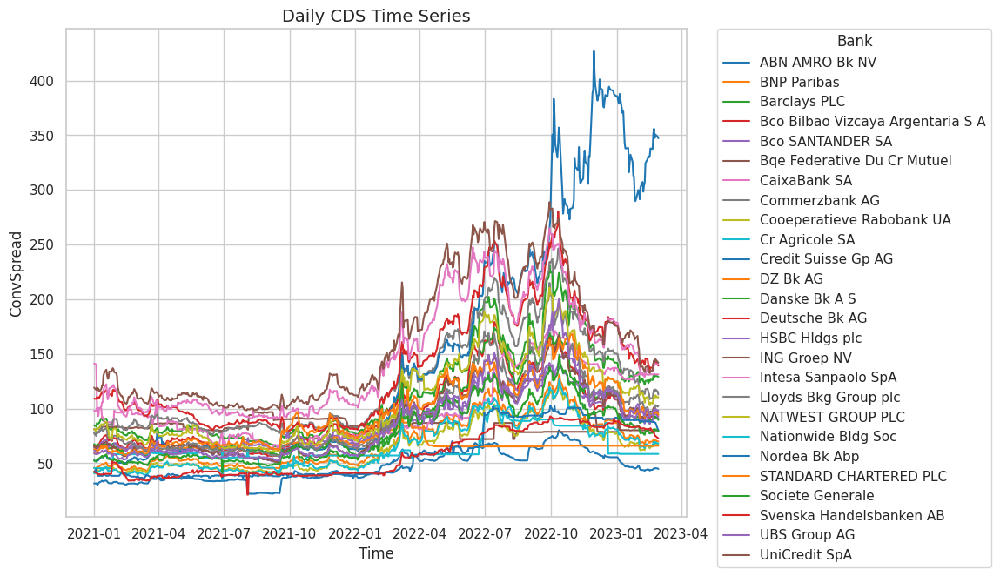

In [ ]:
# general plot

sns.set_theme(style = "whitegrid")

plt.figure(figsize = (11.75,7))
sns.lineplot(data = daily_data, x = 'Date', y = 'ConvSpread', hue = 'ShortName', palette = 'tab10')

plt.title('Daily CDS Time Series', fontsize = 14)
plt.xlabel('Time', fontsize = 12)
plt.ylabel('ConvSpread', fontsize = 12)

plt.legend(title = 'Bank', bbox_to_anchor = (1.05,1), loc = 'upper left', borderaxespad = 0)
plt.tight_layout()
plt.show()

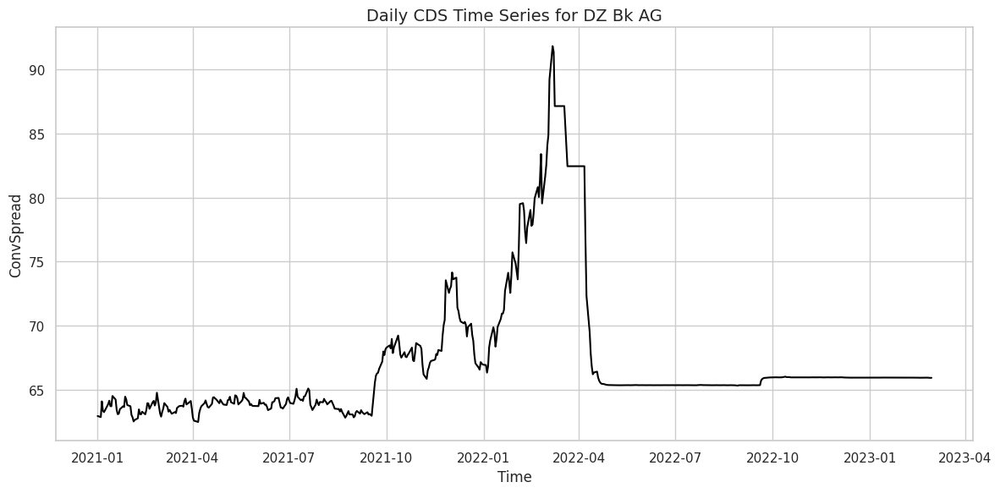

In [ ]:
# to plot a single bank

bank = 'DZ Bk AG'

sns.set_theme(style = "whitegrid")
filtered_data = daily_data[daily_data.ShortName == bank]

plt.figure(figsize = (12,6))
sns.lineplot(data = filtered_data, x = 'Date', y = 'ConvSpread', color = 'black')

plt.title(f"Daily CDS Time Series for {bank}", fontsize = 14)
plt.xlabel('Time', fontsize = 12)
plt.ylabel('ConvSpread', fontsize = 12)

plt.tight_layout()
plt.show()

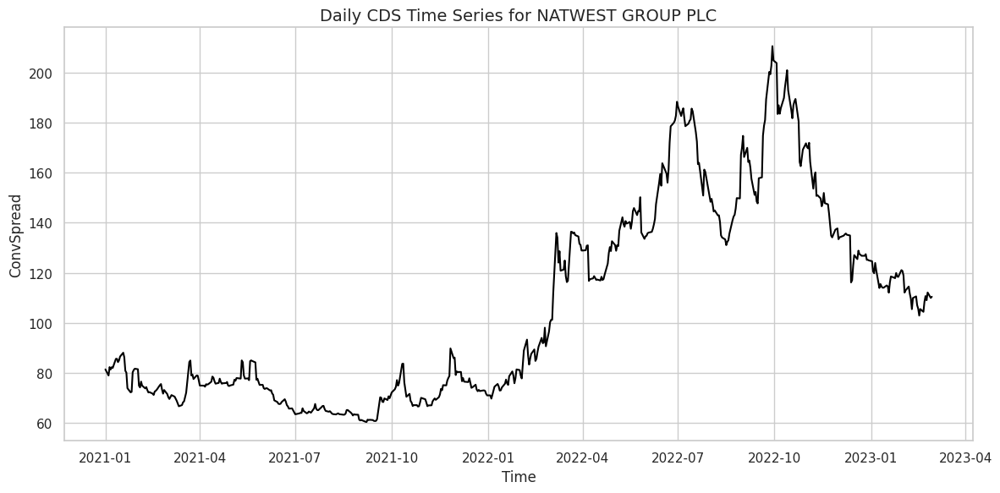

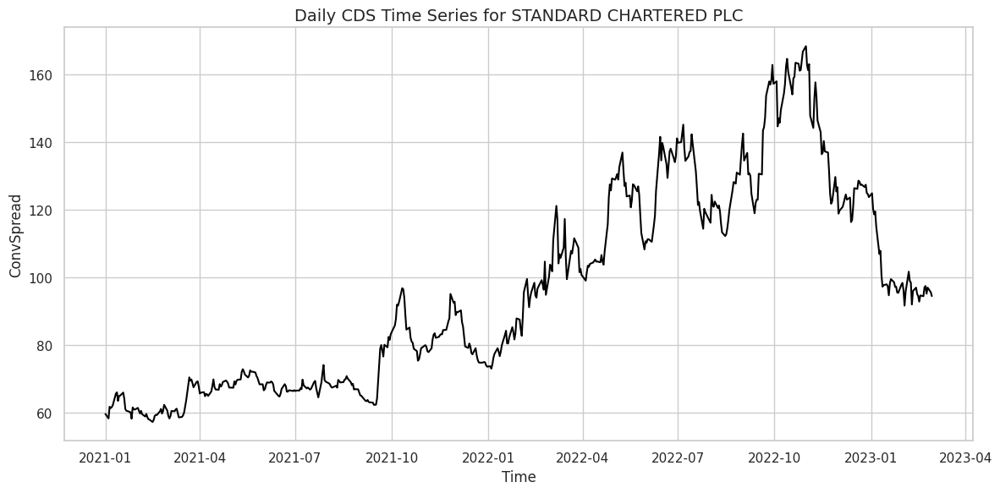

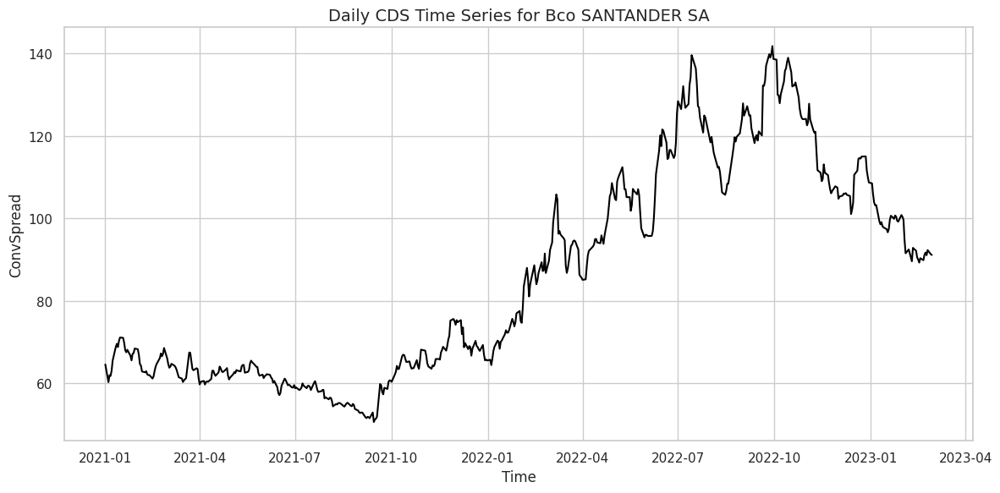

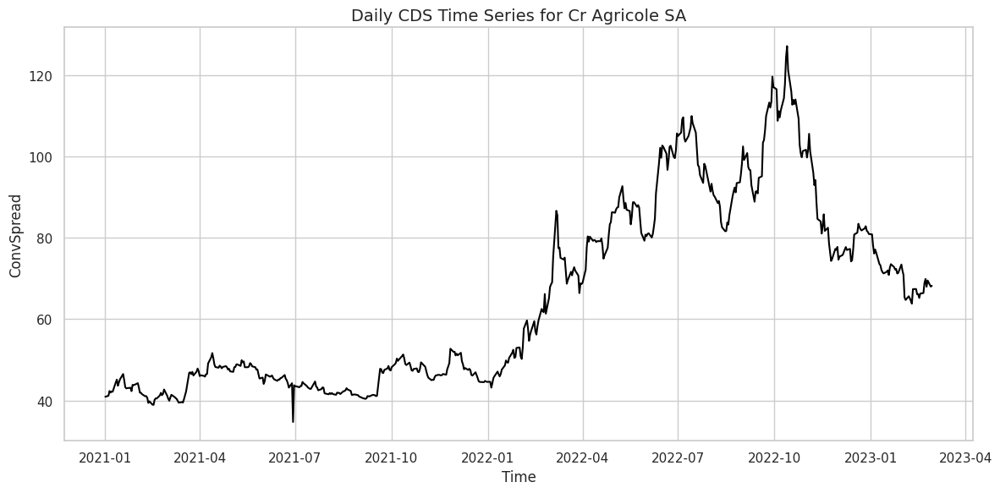

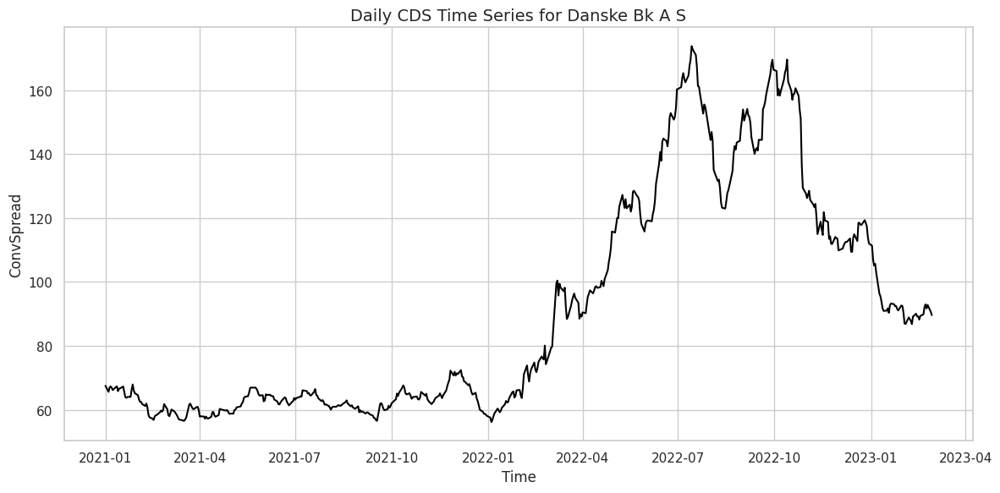

...

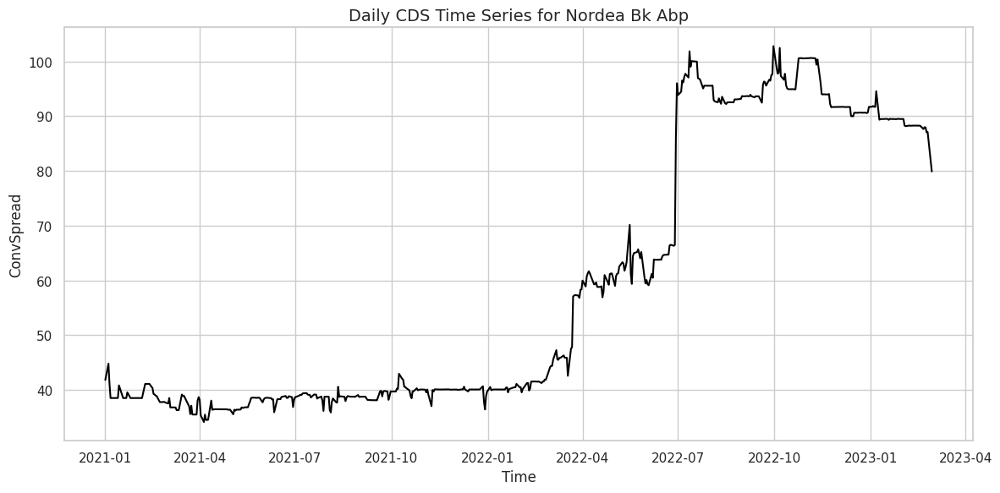

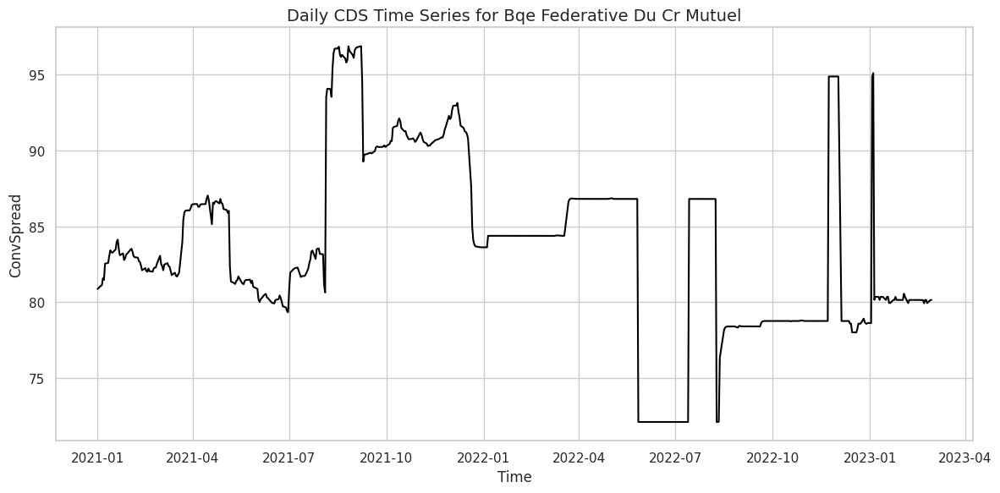

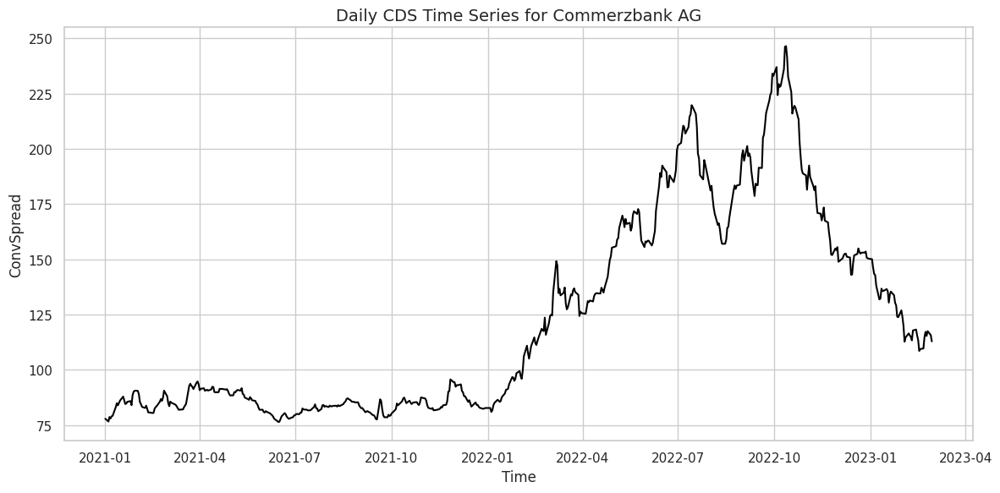

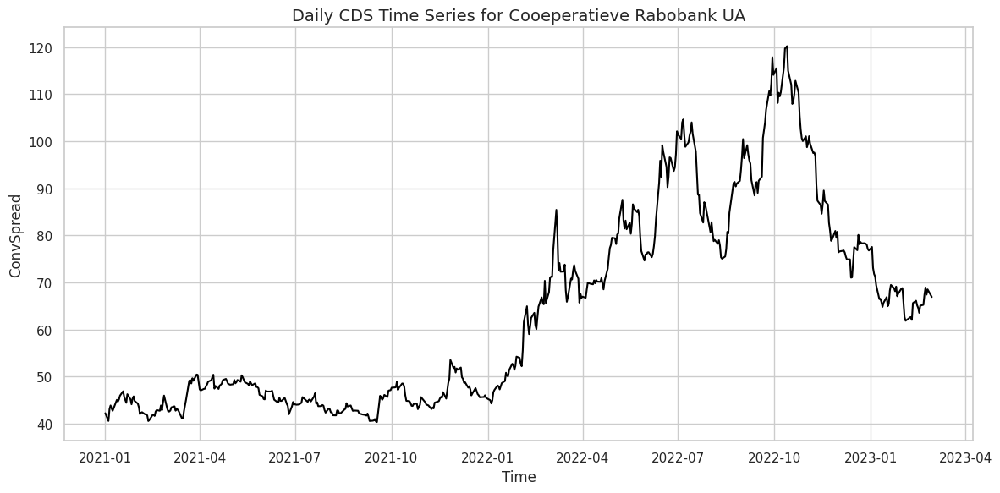

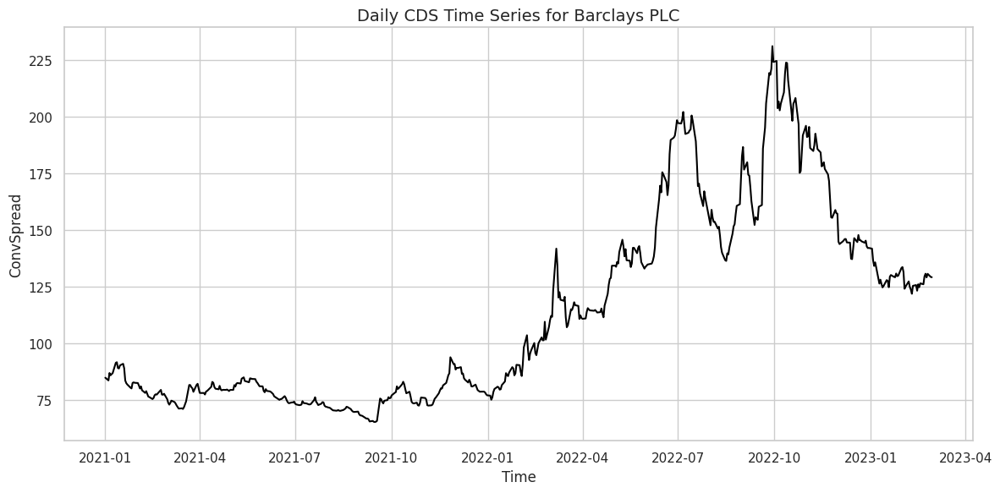

In [ ]:
# plot for each bank to spot specificities

for bank in banks_new:

  sns.set_theme(style = "whitegrid")
  filtered_data = daily_data[daily_data.ShortName == bank]

  plt.figure(figsize = (12,6))
  sns.lineplot(data = filtered_data, x = 'Date', y = 'ConvSpread', color = 'black')

  plt.title(f"Daily CDS Time Series for {bank}", fontsize = 14)
  plt.xlabel('Time', fontsize = 12)
  plt.ylabel('ConvSpread', fontsize = 12)

  plt.tight_layout()
  plt.show()

In [ ]:
# outliers: 1. Credit Suisse -> high risk for internal problems, in Oct22 restructuring plan, will almost fail in March23 -> to keep, natural variability
# 2. DZ, Mutuel and Nationwide -> strange behavior, imo to discard bc artificial undervaluation of risk
# Maybe some mistakes in data collection
# let's consider only the time span we need and remove DZ, Mutuel and Nationwide
# in order to compute the modified epsilon-drawups, we need 10 days in addition before 2021-01-02 and 3 days after 2023-01-31

daily_data = daily_data[(daily_data.Date >= pd.to_datetime("2021-01-18")) & (daily_data.Date <= pd.to_datetime("2023-02-03")) & (daily_data.ShortName != "DZ Bk AG") & (daily_data.ShortName != "Bqe Federative Du Cr Mutuel") & (daily_data.ShortName != 'Nationwide Bldg Soc')]
daily_data = daily_data.reset_index(drop = True, inplace = False)

In [5]:
# daily data

#daily_data.to_csv('/content/drive/My Drive/daily_data.csv', index = False)
daily_data = pd.read_csv("/content/drive/MyDrive/daily_data.csv")
daily_data.loc[:, 'Date'] = pd.to_datetime(daily_data['Date'])
daily_data

,Date,ShortName,ConvSpread
0,2021-01-18 00:00:00,ABN AMRO Bk NV,34.185000
1,2021-01-18 00:00:00,BNP Paribas,50.586771
2,2021-01-18 00:00:00,Barclays PLC,90.908000
3,2021-01-18 00:00:00,Bco Bilbao Vizcaya Argentaria S A,75.771686
4,2021-01-18 00:00:00,Bco SANTANDER SA,71.029429
...,...,...,...
12185,2023-02-03 00:00:00,STANDARD CHARTERED PLC,95.783133
12186,2023-02-03 00:00:00,Societe Generale,77.250663
12187,2023-02-03 00:00:00,Svenska Handelsbanken AB,82.056667
12188,2023-02-03 00:00:00,UBS Group AG,96.294950


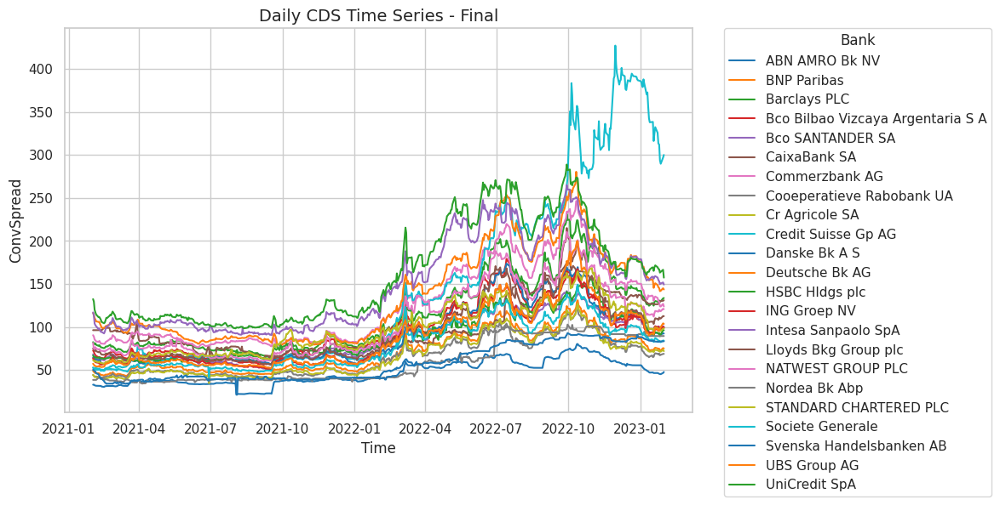

In [8]:
# general plot - definitive

plot_data = daily_data[(daily_data.Date >= pd.to_datetime('2021-02-01')) & (daily_data.Date <= pd.to_datetime("2023-01-31"))]

sns.set_theme(style = "whitegrid")

plt.figure(figsize = (12,6))
sns.lineplot(data = plot_data, x = 'Date', y = 'ConvSpread', hue = 'ShortName', palette = 'tab10')

plt.title('Daily CDS Time Series - Final', fontsize = 14)
plt.xlabel('Time', fontsize = 12)
plt.ylabel('ConvSpread', fontsize = 12)

plt.legend(title = 'Bank', bbox_to_anchor = (1.05,1), loc = 'upper left', borderaxespad = 0)
plt.tight_layout()
plt.show()

# TS ANALYSIS

In [ ]:
# descriptive statistics of my TSs

print(f"Sample period spans {daily_data.Date[0]} to {daily_data.Date[12189]}")
print(f"Total days considered: {len(daily_data.Date.unique())}")
print()

print(f"Number of considered banks: {len(daily_data.ShortName.unique())}")
print()

TS_mean = daily_data['ConvSpread'].mean()
TS_dev_std = daily_data['ConvSpread'].std()
TS_min = daily_data['ConvSpread'].min()
TS_max = daily_data['ConvSpread'].max()
TS_skew = skew(daily_data['ConvSpread'])
TS_kurt = kurtosis(daily_data['ConvSpread'])

print("Summary statistics of my Time Series:")
print(f"Mean: {TS_mean}")
print(f"Standard Deviation: {TS_dev_std}") # very high volatility wrt mean
print(f"Minimum: {TS_min}")
print(f"Maximum: {TS_max}")
print(f"Skewness: {TS_skew}") # right tail is fatter than left
print(f"Kurtosis: {TS_kurt}") # large values more often than Normality

Sample period spans 2021-01-18 00:00:00 to 2023-02-03 00:00:00
Total days considered: 530

Number of considered banks: 23

Summary statistics of my Time Series:
Mean: 95.73143442955454
Standard Deviation: 50.5784489154997
Minimum: 21.26
Maximum: 426.9921555555556
Skewness: 1.7772451151241153
Kurtosis: 4.778756876787569


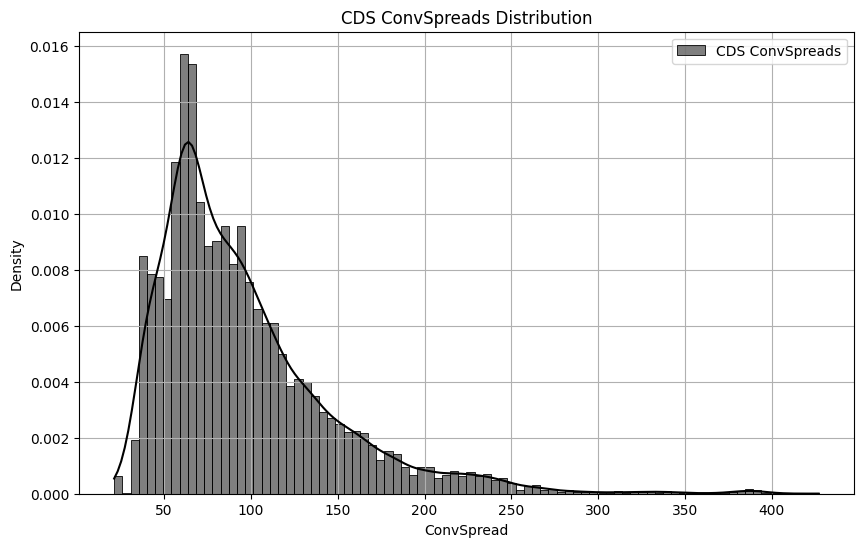

In [ ]:
# plotting

plt.figure(figsize = (10,6))

sns.histplot(daily_data['ConvSpread'], bins = 'auto', kde = True, color = 'black', stat = 'density', label = 'CDS ConvSpreads')

plt.title("CDS ConvSpreads Distribution")
plt.xlabel("ConvSpread")
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Persistence and stationarity (Oh & Patton)

daily_data_pivot = daily_data.pivot(index = 'Date', columns = 'ShortName', values = 'ConvSpread')

# First-order autocorr
autocorr_first_order = daily_data_pivot.apply(lambda x: x.autocorr(lag = 1), axis = 0)
median_autocorr = np.median(autocorr_first_order)
min_autocorr = autocorr_first_order.min()

print(f"Median value of the first-order autocorrelation: {median_autocorr}")
print(f"Minimum value of the first-order autocorrelation: {min_autocorr}")
print()

# DF Test
results = {}
for col in daily_data_pivot.columns:
    series = daily_data_pivot[col]
    adf_result = adfuller(series)
    p_value = adf_result[1]
    results[col] = p_value

# How many series rejects Ho (p < 0.05)
reject_count = sum(p < 0.05 for p in results.values())
print(f"Number of series that rejects the null of a unit root: {reject_count}")

Median value of the first-order autocorrelation: 0.9963467331180247
Minimum value of the first-order autocorrelation: 0.9921684074771487

Number of series that rejects the null of a unit root: 0


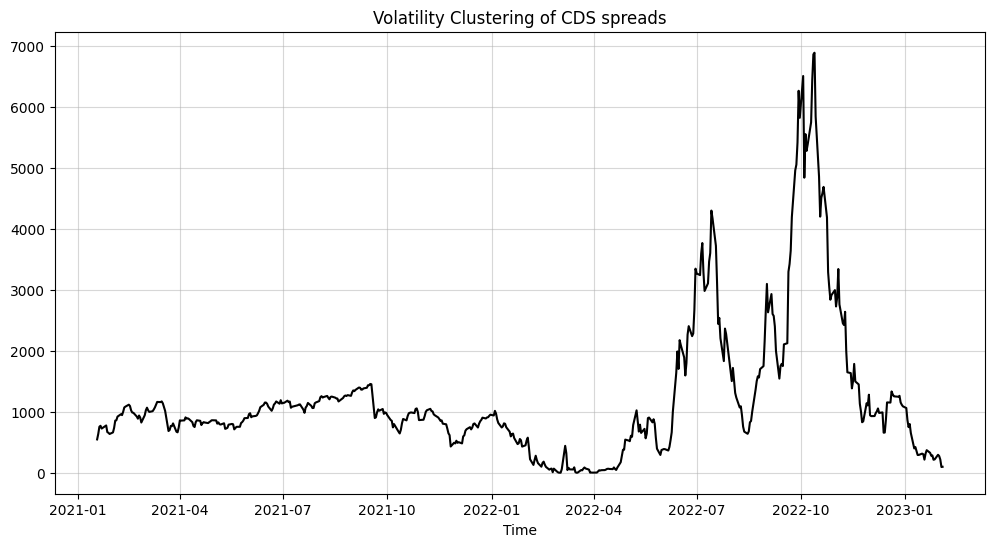

In [ ]:
# volatility clustering

daily_mean = daily_data.groupby('Date')['ConvSpread'].mean()
difference = (daily_mean - TS_mean)**2

# plotting
plt.figure(figsize = (12,6))
plt.plot(difference.index, difference.values, linestyle = '-', color = 'black')
plt.title('Volatility Clustering of CDS spreads')
plt.xlabel('Time')
plt.grid(alpha = 0.5)
plt.show()

In [ ]:
# Log-differenced data for LB test

log_data = np.log(daily_data_pivot)
log_diff_data = log_data.diff()
log_diff_data = log_diff_data.dropna() #let's delete the first row of NaNs
log_diff_data

ShortName,ABN AMRO Bk NV,BNP Paribas,Barclays PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,CaixaBank SA,Commerzbank AG,Cooeperatieve Rabobank UA,Cr Agricole SA,Credit Suisse Gp AG,...,ING Groep NV,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,NATWEST GROUP PLC,Nordea Bk Abp,STANDARD CHARTERED PLC,Societe Generale,Svenska Handelsbanken AB,UBS Group AG,UniCredit SpA
Date,,,,,,,,,,,,,,,,,,,,,
2021-01-19,-0.017484,-0.022166,-0.021914,-0.022866,-0.017221,0.000063,-0.018045,-0.025916,-0.032448,-0.024973,...,-0.023403,-0.078709,-0.027377,-0.020743,-0.000075,-0.027959,-0.032584,-0.005795,-0.028208,-0.033532
2021-01-20,-0.031641,-0.029000,-0.062663,-0.030422,-0.025770,0.000037,-0.021315,-0.014417,-0.039271,-0.021782,...,-0.026685,-0.041295,-0.077290,-0.064638,0.000076,-0.048610,-0.031938,0.003108,-0.023842,-0.029765
2021-01-21,-0.016200,-0.022888,-0.014363,-0.017233,-0.007640,0.000051,0.002599,-0.013470,-0.007495,0.001281,...,0.020433,0.015965,-0.010734,-0.009520,0.000055,-0.008933,-0.011779,0.001800,-0.003981,0.001151
2021-01-22,-0.008215,0.018450,-0.007309,0.007755,0.009058,-0.000079,0.009422,0.040513,0.001692,0.014577,...,-0.000942,0.072788,0.002404,-0.080427,0.026609,-0.000733,0.000660,-0.004632,0.015781,0.048778
2021-01-25,-0.004117,-0.029438,-0.017196,0.002697,-0.021729,-0.000079,0.003672,-0.023663,0.002059,-0.019862,...,-0.029315,0.007618,-0.025747,-0.022606,-0.026708,-0.006504,-0.012915,0.004169,-0.024970,0.002847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-30,0.031187,0.037904,0.025754,0.018533,0.016019,0.001329,0.024806,0.016106,0.028522,0.024503,...,0.028152,0.008569,0.025413,0.022629,-0.000408,0.025154,0.023253,0.002401,0.041184,0.014417
2023-01-31,0.023130,-0.005256,0.003265,0.008082,-0.004146,0.004710,-0.024076,0.001462,-0.020430,0.010171,...,-0.011474,-0.016053,-0.000977,-0.002685,0.000311,0.005197,-0.002537,0.000533,-0.005854,-0.056478
2023-02-01,-0.012244,-0.015024,-0.016495,-0.013884,-0.007358,-0.000066,-0.032769,-0.046970,-0.014936,-0.005623,...,-0.017671,-0.016550,-0.024690,-0.015426,-0.000253,-0.022388,-0.006681,0.000126,-0.014647,-0.021289


In [ ]:
# Autocorrelation -> Ljung-Box test (Oh & Patton)

ljung_box_results = {}

for col in log_diff_data:
    series = log_diff_data[col]
    test_result = acorr_ljungbox(series, lags = 10, return_df = True) #until the 10th lag
    p_value = test_result['lb_pvalue'].iloc[-1]
    ljung_box_results[col] = p_value

significant_autocorr = sum(p < 0.05 for p in ljung_box_results.values())

print(f"Number of series with significant autocorrelation: {significant_autocorr}") #all banks

Number of series with significant autocorrelation: 14


# DATA PREPARATION FOR BAYESIAN NETWORK

In [ ]:
# preparation of Epsilon column

daily_data['Epsilon'] = np.nan
daily_data.head()

,Date,ShortName,ConvSpread,Epsilon
0,2021-01-18 00:00:00,ABN AMRO Bk NV,34.185000,NaN
1,2021-01-18 00:00:00,BNP Paribas,50.586771,NaN
2,2021-01-18 00:00:00,Barclays PLC,90.908000,NaN
3,2021-01-18 00:00:00,Bco Bilbao Vizcaya Argentaria S A,75.771686,NaN
4,2021-01-18 00:00:00,Bco SANTANDER SA,71.029429,NaN


In [ ]:
# computation for modified-epsilon drawups

dates = list(daily_data.Date.unique())
banks = list(daily_data.ShortName.unique())

for bank in banks:

  data = daily_data[daily_data.ShortName == bank] #to avoid to specify it every time

  local_mins = []
  local_maxs = []

  i = 10 #we start from the 10th date

  while i < len(dates)-1:

      date = dates[i]

      current_date = data[data.Date == date]
      prev_date = data[data.Date == dates[i-1]]
      next_date = data[data.Date == dates[i+1]]

      if current_date.ConvSpread.iloc[0] < prev_date.ConvSpread.iloc[0] and current_date.ConvSpread.iloc[0] < next_date.ConvSpread.iloc[0]: #local min

          local_min = date #not to append now, I may not find a local max

          # Only now we look for a local max
          found_max = False #we may not find a max for a min: in that case we stop the search

          for j in range(i+1, len(dates)-1):

              next_date = data[data.Date == dates[j]]
              following_date = data[data.Date == dates[j+1]]

              if next_date.ConvSpread.iloc[0] > following_date.ConvSpread.iloc[0]: #local max

                  local_max = dates[j]
                  local_mins.append(local_min)
                  local_maxs.append(local_max)

                  i = j+1
                  found_max = True
                  break

          if not found_max: #no max for a min, let's go for another bank
            break

      else:
        i += 1

  # now let's compute the modified epsilon-drawups
  for min,max in zip(local_mins,local_maxs):

    min_spread = data.ConvSpread[data.Date == min].iloc[0]
    max_spread = data.ConvSpread[data.Date == max].iloc[0]

    min_index = dates.index(min)
    ten_days_ago = dates[min_index-10]

    window = data.ConvSpread[(data.Date >= ten_days_ago) & (data.Date <= min)]

    std = np.std(window)

    if std < (max_spread - min_spread): #modified epsilon-drawup
       daily_data.loc[(daily_data.ShortName == bank) & (daily_data.Date == min), 'Epsilon'] = 1

In [ ]:
# dropping now useless data

day_data = daily_data[(daily_data.Date >= pd.to_datetime('2021-02-01'))]
day_data

,Date,ShortName,ConvSpread,Epsilon
230,2021-02-01 00:00:00,ABN AMRO Bk NV,32.910250,NaN
231,2021-02-01 00:00:00,BNP Paribas,48.921657,NaN
232,2021-02-01 00:00:00,Barclays PLC,82.409250,NaN
233,2021-02-01 00:00:00,Bco Bilbao Vizcaya Argentaria S A,72.706543,NaN
234,2021-02-01 00:00:00,Bco SANTANDER SA,68.267543,NaN
...,...,...,...,...
12185,2023-02-03 00:00:00,STANDARD CHARTERED PLC,95.783133,NaN
12186,2023-02-03 00:00:00,Societe Generale,77.250663,NaN
12187,2023-02-03 00:00:00,Svenska Handelsbanken AB,82.056667,NaN
12188,2023-02-03 00:00:00,UBS Group AG,96.294950,NaN


In [ ]:
# preparing my data for being the input of BN estimation

epsilon_table = day_data.pivot(index = 'Date', columns = 'ShortName', values = 'Epsilon')
epsilon_table.reset_index(inplace = True)
epsilon_table

ShortName,Date,ABN AMRO Bk NV,BNP Paribas,Barclays PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,CaixaBank SA,Commerzbank AG,Cooeperatieve Rabobank UA,Cr Agricole SA,...,ING Groep NV,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,NATWEST GROUP PLC,Nordea Bk Abp,STANDARD CHARTERED PLC,Societe Generale,Svenska Handelsbanken AB,UBS Group AG,UniCredit SpA
0,2021-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2021-02-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN
3,2021-02-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2021-02-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515,2023-01-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
516,2023-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
517,2023-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
518,2023-02-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# completing the data by putting either 0.5 or 0 instead of NaN
# I put 0.5, but then I try to analyse the difference between taking it or not into consideration

for bank in epsilon_table.columns[1:]:

    for i in range(0,len(epsilon_table)-3):

      if epsilon_table.loc[i,bank] != 1:

        if epsilon_table.loc[i+1,bank] == 1 or epsilon_table.loc[i+2,bank] == 1 or epsilon_table.loc[i+3,bank] == 1:
          epsilon_table.loc[i,bank] = 0.5

        else:
          epsilon_table.loc[i,bank] = 0

In [ ]:
# removing now useless data
# how many 0s, 0.5s and 1s?

data = epsilon_table[(epsilon_table.Date <= pd.to_datetime("2023-01-31"))]

pd.set_option('display.max_columns', None)
frequency_table = data.drop(columns = ['Date']).apply(pd.Series.value_counts, normalize = True)
frequency_table['Mean Frequency'] = frequency_table.mean(axis = 1)
frequency_table

ShortName,ABN AMRO Bk NV,BNP Paribas,Barclays PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,CaixaBank SA,Commerzbank AG,Cooeperatieve Rabobank UA,Cr Agricole SA,Credit Suisse Gp AG,Danske Bk A S,Deutsche Bk AG,HSBC Hldgs plc,ING Groep NV,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,NATWEST GROUP PLC,Nordea Bk Abp,STANDARD CHARTERED PLC,Societe Generale,Svenska Handelsbanken AB,UBS Group AG,UniCredit SpA,Mean Frequency
0.0,0.779497,0.649903,0.655706,0.680851,0.615087,0.595745,0.684720,0.615087,0.646035,0.60735,0.649903,0.694391,0.570600,0.628627,0.636364,0.605416,0.644101,0.568665,0.613153,0.630561,0.647969,0.647969,0.638298,0.639391
0.5,0.164410,0.261122,0.257253,0.237911,0.286267,0.297872,0.234043,0.284333,0.261122,0.29207,0.261122,0.228240,0.317215,0.272727,0.268859,0.292070,0.264990,0.319149,0.284333,0.274662,0.261122,0.259188,0.268859,0.267345
1.0,0.056093,0.088975,0.087041,0.081238,0.098646,0.106383,0.081238,0.100580,0.092843,0.10058,0.088975,0.077369,0.112186,0.098646,0.094778,0.102515,0.090909,0.112186,0.102515,0.094778,0.090909,0.092843,0.092843,0.093264


In [ ]:
# final data

#data.to_csv('/content/drive/My Drive/data.csv', index = False)
data = pd.read_csv("/content/drive/MyDrive/data.csv")
data.loc[:, 'Date'] = pd.to_datetime(data['Date'])
data

,Date,ABN AMRO Bk NV,BNP Paribas,Barclays PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,CaixaBank SA,Commerzbank AG,Cooeperatieve Rabobank UA,Cr Agricole SA,Credit Suisse Gp AG,Danske Bk A S,Deutsche Bk AG,HSBC Hldgs plc,ING Groep NV,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,NATWEST GROUP PLC,Nordea Bk Abp,STANDARD CHARTERED PLC,Societe Generale,Svenska Handelsbanken AB,UBS Group AG,UniCredit SpA
0,2021-02-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.5,0.0,0.0,0.0
1,2021-02-02 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.5,0.0,0.5,0.0,0.0,0.0
2,2021-02-03 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.5,0.0,1.0,0.0,0.0,0.0
3,2021-02-04 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0
4,2021-02-05 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,2023-01-25 00:00:00,0.5,0.5,0.5,0.5,0.5,0.0,0.0,0.5,0.5,0.0,0.5,0.0,0.5,0.5,0.0,0.5,0.5,1.0,0.5,0.5,0.0,0.0,0.5
513,2023-01-26 00:00:00,0.5,0.5,1.0,1.0,0.5,0.0,0.0,1.0,1.0,0.0,0.5,0.0,1.0,1.0,0.0,1.0,0.5,0.0,0.5,0.5,0.0,0.0,1.0
514,2023-01-27 00:00:00,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
515,2023-01-30 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# USEFUL FUNCTION FOR BAYESIAN NETOWRKS

### CONNECTDNESS

In [ ]:
# A certain bank does not appear in the DAG. Is it a disconnected node?
# Let's find out with the adjacency matrix

def checking_connectdness(DAG):

  adj_matrix = DAG['adjmat']

  disconnected_nodes = []

  for idx, bank in enumerate(adj_matrix.index):

  # one index, one banck, both row and column
    is_row_empty = (adj_matrix.iloc[idx, :] == False).all()
    is_col_empty = (adj_matrix.iloc[:, idx] == False).all()

    if is_row_empty and is_col_empty:
      disconnected_nodes.append(bank)

  if len(disconnected_nodes) == 0:
    disconnected_nodes.append("All nodes are connected")

  return disconnected_nodes

### INFERENCE DTD

In [ ]:
# 1. inference day-to-day

def inference_ij_dtd(samples,date):

  results = []

  for bankj in samples.columns:

    for banki in samples.columns:

      if bankj != banki:

        nij = 0
        nj = 0

        for row in range(0,len(samples)-1):

          valj = samples[bankj].iloc[row]
          vali = samples[banki].iloc[row]

          if valj == 1:
            nj += 1

            if vali == 1: #considering conditional only if in the same row both 1s
              nij += 1

        pij = nij / nj

        results.append((banki, bankj, pij, date))

  return results

In [ ]:
# 1. inference day-to-day

def inference_propj_dtd(samples,date):

  results = []

  for column in samples.columns:

    mean_stress_per_row = []

    for row in samples.itertuples(index = False):

      row = pd.Series(row, index = samples.columns)

      if row[column] == 1:

        other_stresses = ((row.drop(column) == 1)).sum() #considering conditional only if in the same row both 1s
        mean_stress_per_row.append(other_stresses)

    avg_stress = (sum(mean_stress_per_row) / len(mean_stress_per_row)) / len(samples.columns)

    results.append((column, avg_stress, date))

  return results

### INFERENCE DTP

In [ ]:
# 2. inference day-to-period

def inference_ij_dtp(samples,date):

  results = []

  for bankj in samples.columns:

    for banki in samples.columns:

      if bankj != banki:

        nij = 0
        nj = 0

        for row in range(0,len(samples)-1):

          valj = samples[bankj].iloc[row]
          vali = samples[banki].iloc[row]

          if valj == 1:
            nj += 1

            if vali == 1 or vali == 0.5: #to take into account that entities can impact each other with a slight delay
              nij += 1

        pij = nij / nj
        results.append((banki, bankj, pij, date))

  return results

In [ ]:
# 2. inference day-to-period

def inference_propj_dtp(samples,date):

  results = []

  for column in samples.columns:

    mean_stress_per_row = []

    for row in samples.itertuples(index = False):

      row = pd.Series(row, index = samples.columns)

      if row[column] == 1:

        other_stresses = ((row.drop(column) == 1) | (row.drop(column) == 0.5)).sum() #to take into account that entities can impact each other with a slight delay
        mean_stress_per_row.append(other_stresses)

    avg_stress = (sum(mean_stress_per_row) / len(mean_stress_per_row)) / len(samples.columns)

    results.append((column, avg_stress, date))

  return results

### PLOT

In [ ]:
# function to plot KDE

def prob_distr(results):

  plt.figure(figsize = (10,6))
  sns.kdeplot(results["P(i|j)"], shade = True, color = 'red', alpha = 0.5)
  plt.title("Probability Distribution", fontsize = 16)
  plt.xlabel("P(i|j)", fontsize = 14)
  plt.ylabel("Density", fontsize = 14)
  plt.grid(alpha = 0.3)
  plt.show()

In [ ]:
# function to analyse the difference among banks, also considering when i and when j

def plot_ij_2yr(results):

  # avg P(i|j) for each bank as j
  mean_as_j = results.groupby('Bank_j')['P(i|j)'].mean()

  # avg P(i|j) for each bank as i
  mean_as_i = results.groupby('Bank_i')['P(i|j)'].mean()

  # overall mean and std dev
  overall_mean = results['P(i|j)'].mean()
  print("Mean:", overall_mean)
  overall_std = results['P(i|j)'].std()
  print("Std Dev:", overall_std)
  j_std = mean_as_j.std()
  print("Std Dev for j:", j_std)
  i_std = mean_as_i.std()
  print("Std Dev for i:", i_std)
  print()

  # Merging the two means for each bank
  banks = sorted(bank for bank in mean_as_j.index)
  mean_data = pd.DataFrame({'Bank': banks})
  mean_data['Mean_as_Bank_j'] = mean_data['Bank'].map(mean_as_j)
  mean_data['Mean_as_Bank_i'] = mean_data['Bank'].map(mean_as_i)

  # Plotting
  x = np.arange(len(banks))
  width = 0.35
  fig, ax = plt.subplots(figsize = (12,6))
  ax.bar(x - width/2, mean_data['Mean_as_Bank_j'], width, label = 'Mean as j')
  ax.bar(x + width/2, mean_data['Mean_as_Bank_i'], width, label = 'Mean as i')
  ax.axhline(y = overall_mean, color = 'red', linestyle = '-', linewidth = 1.5, label = 'Overall mean')
  ax.axhline(y = overall_mean + overall_std, color = 'blue', linestyle = '--', linewidth = 1, label = 'Mean+Std')
  ax.axhline(y = overall_mean - overall_std, color = 'blue', linestyle = '--', linewidth = 1, label = 'Mean-Std')
  ax.set_xticks(x)
  ax.set_xticklabels(banks, rotation = 45, ha = 'right')
  ax.set_xlabel('Banks')
  ax.set_ylabel('P(i|j)')
  ax.set_title('Average conditional probability of distress for each bank')
  ax.legend()
  ax.grid(axis = 'y', linestyle = '--', alpha = 0.7)
  plt.tight_layout()
  plt.show()

In [ ]:
# function to plot the different proportions in descending order

def plot_prop_2yr(results):

  mean = results['E[Stressed Banks|Bank]'].mean()
  print("Mean:", mean)
  std = results['E[Stressed Banks|Bank]'].std()
  print("Std:", std)
  print()

  results = results.sort_values(by = 'E[Stressed Banks|Bank]', ascending = False)
  plt.figure(figsize = (12,6))
  plt.bar(results['Bank'], results['E[Stressed Banks|Bank]'], color = 'skyblue', edgecolor = 'black')
  plt.xlabel('Bank', fontsize = 12)
  plt.ylabel('E[Stressed Banks|Bank]', fontsize = 12)
  plt.title('Expected Proportion of Banks in Distress', fontsize = 14)
  plt.xticks(rotation = 45, ha = 'right', fontsize = 10)
  plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
  plt.tight_layout()
  plt.show()

# BAYESIAN NETWORK ON THE WHOLE PERIOD

## ESTIMATION

In [ ]:
# Let's start by estimating the BN on the whole period (2 years)
# We have first to drop the Date column -> no time dimension

data_0 = data.drop(columns = ['Date'])

[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.


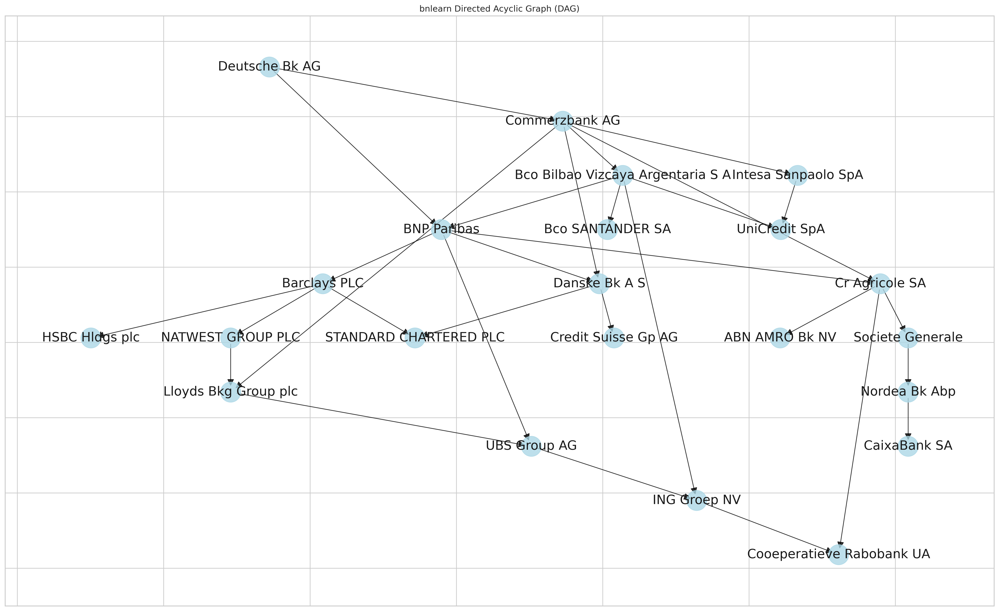

In [ ]:
# Estimating and plotting the DAG

DAG_0 = bn.structure_learning.fit(data_0, methodtype = 'hc', scoretype = 'bic', verbose = 0)
G_0 = bn.plot(DAG_0, params_static = {'figsize': (25, 15), 'dpi': 300, 'font_size': 18}, edge_labels = None, verbose = 0)

In [ ]:
# Svenska Handelsbanken AB does not appear in the DAG. Is it a disconnected node?
# Yes

checking_connectdness(DAG_0)

['Svenska Handelsbanken AB']

['All nodes are connected']
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.


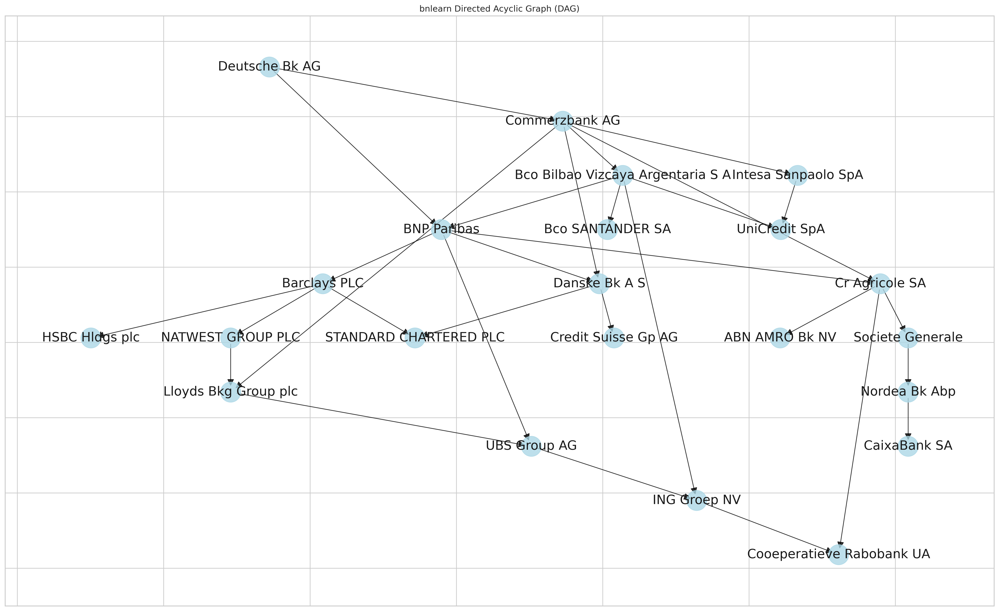

In [ ]:
# checking that, if I discard Svenska Handelsbanken AB, I find the same DAG
# Discarding the bank
# Estimating and plotting the new DAG

data_noSH = data_0.drop(columns = ["Svenska Handelsbanken AB"])

DAG_noSH = bn.structure_learning.fit(data_noSH, methodtype = 'hc', scoretype = 'bic', verbose = 0)

print(checking_connectdness(DAG_noSH))

G_noSH = bn.plot(DAG_noSH, params_static = {'figsize': (25, 15), 'dpi': 300, 'font_size': 18}, edge_labels = None, verbose = 0)

In [ ]:
# Apparently Svenska Handelsbanken AB is independent of the other banks, so given any
# bank's behaviour (stress or not) in a certain date, we do not have any additional info about
# Svenska Handelsbanken AB's behaviour
# Now parameter learning
# No Svenska Handelsbanken AB -> no results for this bank
# Marginals != Relative Frequency

print("CPDs computation...")
model_0 = bn.parameter_learning.fit(DAG_0, data_0, methodtype = 'bayes', scoretype = 'bdeu')

CPDs computation...
[bnlearn] >Parameter learning> Computing parameters using [bayes]
[bnlearn] >Converting [<class 'pgmpy.base.DAG.DAG'>] to BayesianNetwork model.
[bnlearn] >Converting adjmat to BayesianNetwork.
[bnlearn] >CPD of BNP Paribas:
+-----------------------------------+-----+----------------------------------------+
| Bco Bilbao Vizcaya Argentaria S A | ... | Bco Bilbao Vizcaya Argentaria S A(1.0) |
+-----------------------------------+-----+----------------------------------------+
| Deutsche Bk AG                    | ... | Deutsche Bk AG(1.0)                    |
+-----------------------------------+-----+----------------------------------------+
| BNP Paribas(0.0)                  | ... | 0.3158041179744018                     |
+-----------------------------------+-----+----------------------------------------+
| BNP Paribas(0.5)                  | ... | 0.2932665553700612                     |
+-----------------------------------+-----+--------------------------------

In [ ]:
# Inference -> forward sampling
# 2 possibilities:
# 1. Given one bank is in distress (=1), another bank is in distress (=1)
# 2. Given one bank is in distress (=1), another bank is o will be in distress (=0.5 or 1)

logging.disable(logging.CRITICAL) #ignore it, to avoid useless print

samples_0 = bn.sampling(model_0, n = 10000, methodtype = 'bayes')

logging.disable(logging.NOTSET) #ignore it, to avoid useless print

In [ ]:
# example of forward sampling output

#samples_0.to_csv('/content/drive/My Drive/samples_0.csv', index = False)
samples_0 = pd.read_csv("/content/drive/MyDrive/samples_0.csv")
samples_0

,BNP Paribas,Barclays PLC,Cr Agricole SA,Danske Bk A S,UBS Group AG,HSBC Hldgs plc,NATWEST GROUP PLC,STANDARD CHARTERED PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,ING Groep NV,UniCredit SpA,Commerzbank AG,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,ABN AMRO Bk NV,Cooeperatieve Rabobank UA,Societe Generale,Credit Suisse Gp AG,Deutsche Bk AG,Nordea Bk Abp,CaixaBank SA
0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.5,0.5,0.0,1.0,0.0,0.0,0.0,0.5,1.0
1,0.0,0.0,1.0,0.5,0.0,1.0,0.5,1.0,0.0,0.0,0.0,1.0,0.5,0.5,0.5,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.5,0.5,1.0,1.0,1.0,0.5,1.0,0.0,0.0,0.0,1.0,0.5,1.0,0.5,0.0,0.0,0.5,1.0,1.0,0.5,1.0
3,0.0,0.5,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.5,0.5,0.0,0.0,0.5,0.5
4,0.5,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.5,0.5,1.0,0.5,0.5,1.0,0.5,0.5,0.0,0.5,1.0,0.0,0.5,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.0,1.0,0.0,1.0,0.5,1.0,1.0,1.0,0.5,1.0,0.0,0.0,0.5,0.5,0.0,0.5,0.0,0.0,0.0,0.5,0.0,0.5
9996,1.0,1.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
9997,0.0,0.0,0.5,0.0,0.0,1.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.5,1.0
9998,0.0,0.5,0.0,0.5,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.5,1.0,1.0,1.0,0.0,0.0,0.5,1.0,0.5,0.5


In [ ]:
# Computing all results (about 5.5/6 mins)

# 1.
results_ij_dtd = inference_ij_dtd(samples_0, "2023-01-31")
results_propj_dtd = inference_propj_dtd(samples_0, "2023-01-31")

# 2.
results_ij_dtp = inference_ij_dtp(samples_0, "2023-01-31")
results_propj_dtp = inference_propj_dtp(samples_0, "2023-01-31")

In [ ]:
# Converting to dataframes for convenience

results_ij_dtd = pd.DataFrame(results_ij_dtd, columns = ['Bank_i', 'Bank_j', 'P(i|j)', 'Date'])
results_ij_dtp = pd.DataFrame(results_ij_dtp, columns = ['Bank_i', 'Bank_j', 'P(i|j)', 'Date'])
results_propj_dtd = pd.DataFrame(results_propj_dtd, columns = ['Bank', 'E[Stressed Banks|Bank]', 'Date'])
results_propj_dtp = pd.DataFrame(results_propj_dtp, columns = ['Bank', 'E[Stressed Banks|Bank]', 'Date'])

In [ ]:
# saving for convenience

#results_ij_dtd.to_csv('/content/drive/My Drive/results_ij_dtd.csv', index = False)
#results_ij_dtp.to_csv('/content/drive/My Drive/results_ij_dtp.csv', index = False)
#results_propj_dtd.to_csv('/content/drive/My Drive/results_propj_dtd.csv', index = False)
#results_propj_dtp.to_csv('/content/drive/My Drive/results_propj_dtp.csv', index = False)

results_ij_dtd = pd.read_csv('/content/drive/My Drive/results_ij_dtd.csv')
results_ij_dtp = pd.read_csv('/content/drive/My Drive/results_ij_dtp.csv')
results_propj_dtd = pd.read_csv('/content/drive/My Drive/results_propj_dtd.csv')
results_propj_dtp = pd.read_csv('/content/drive/My Drive/results_propj_dtp.csv')

## INFERENCE PROBABILITIES

In [ ]:
# Showing results_ij

results_ij_dtd

,Bank_i,Bank_j,P(i|j),Date
0,Barclays PLC,BNP Paribas,0.361446,2023-01-31
1,Cr Agricole SA,BNP Paribas,0.369478,2023-01-31
2,Danske Bk A S,BNP Paribas,0.368139,2023-01-31
3,UBS Group AG,BNP Paribas,0.348394,2023-01-31
4,HSBC Hldgs plc,BNP Paribas,0.301539,2023-01-31
...,...,...,...,...
457,Cooeperatieve Rabobank UA,CaixaBank SA,0.294500,2023-01-31
458,Societe Generale,CaixaBank SA,0.287242,2023-01-31
459,Credit Suisse Gp AG,CaixaBank SA,0.275783,2023-01-31
460,Deutsche Bk AG,CaixaBank SA,0.250191,2023-01-31


### DTD

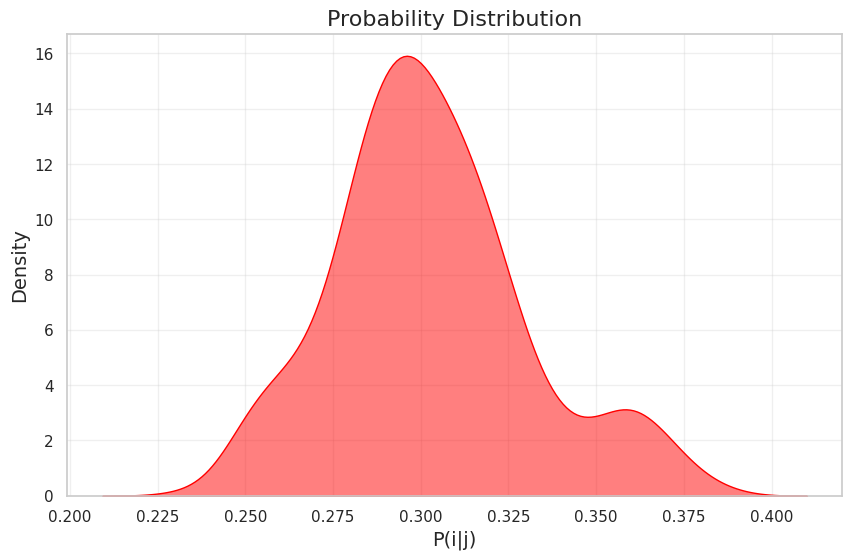

In [ ]:
# KDE dtd

prob_distr(results_ij_dtd)

Mean: 0.3027098287878446
Std Dev: 0.027982598763766985
Std Dev for j: 0.007903884012319565
Std Dev for i: 0.020617379432322336



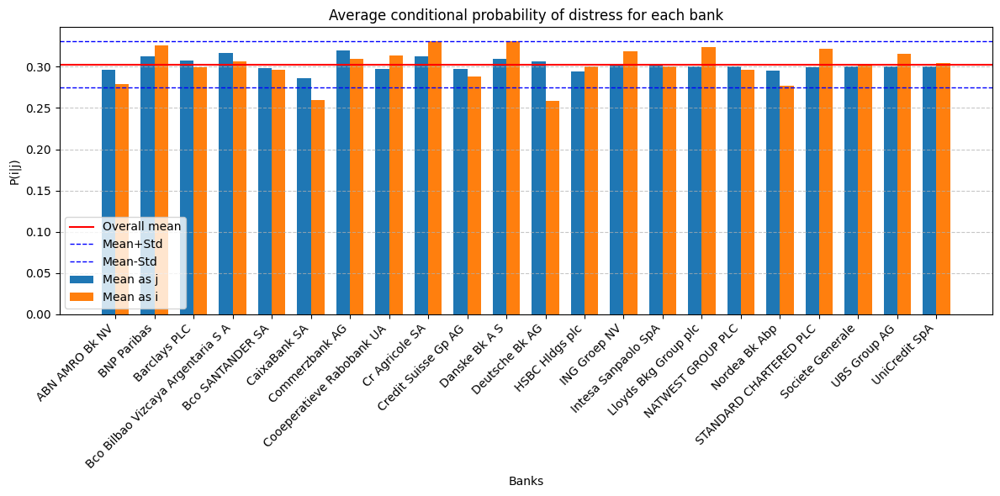

In [ ]:
# a more precise analysis -> much higher volatility when i

plot_ij_2yr(results_ij_dtd)

### DTP

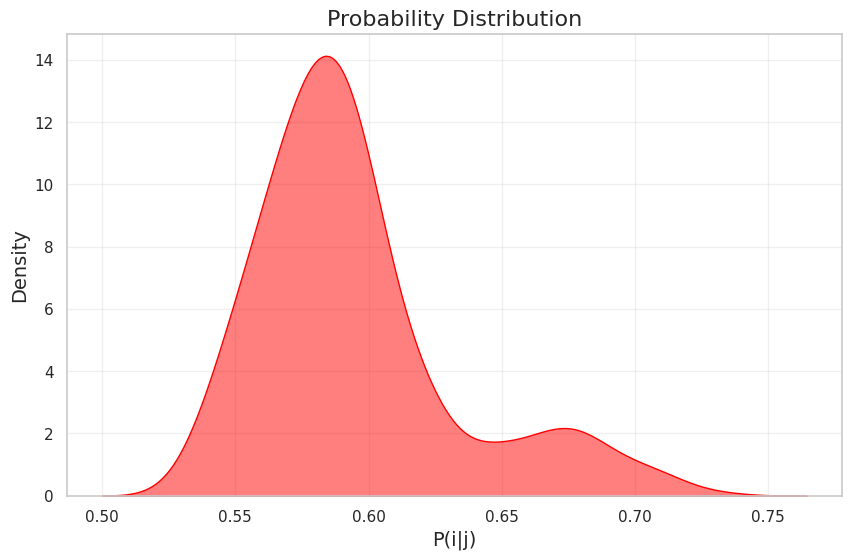

In [ ]:
# KDE dtp

prob_distr(results_ij_dtp)

Mean: 0.594514392946198
Std Dev: 0.038123028334540024
Std Dev for j: 0.01374655982521032
Std Dev for i: 0.01888645627063984



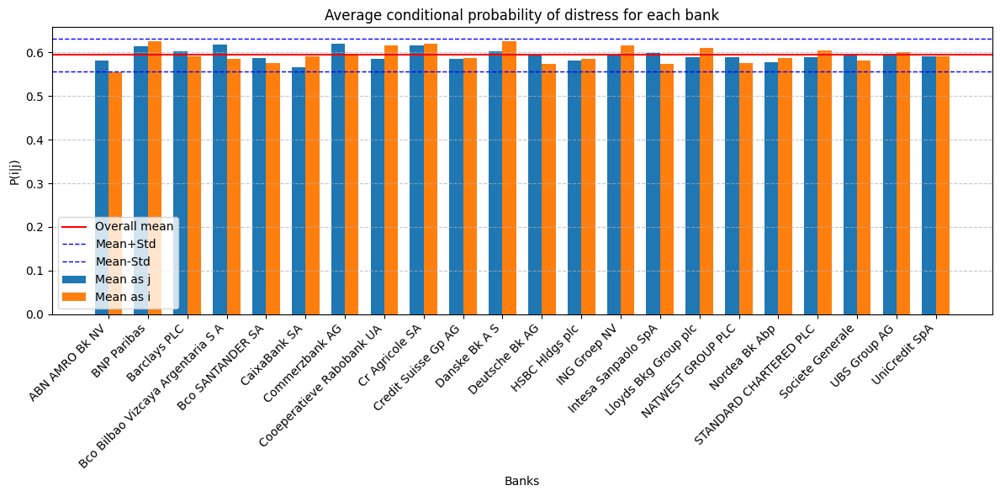

In [ ]:
# a more precise analysis

plot_ij_2yr(results_ij_dtp)

## INFERENCE PROPORTIONS

In [ ]:
# Showing results_ij

results_propj_dtd

,Bank,E[Stressed Banks|Bank],Date
0,BNP Paribas,0.298534,2023-01-31
1,Barclays PLC,0.293987,2023-01-31
2,Cr Agricole SA,0.298695,2023-01-31
3,Danske Bk A S,0.296041,2023-01-31
4,UBS Group AG,0.286889,2023-01-31
5,HSBC Hldgs plc,0.281299,2023-01-31
6,NATWEST GROUP PLC,0.286520,2023-01-31
7,STANDARD CHARTERED PLC,0.285885,2023-01-31
8,Bco Bilbao Vizcaya Argentaria S A,0.302351,2023-01-31
9,Bco SANTANDER SA,0.284944,2023-01-31


### DTD

Mean: 0.2889611362981537
Std: 0.007542178617424095



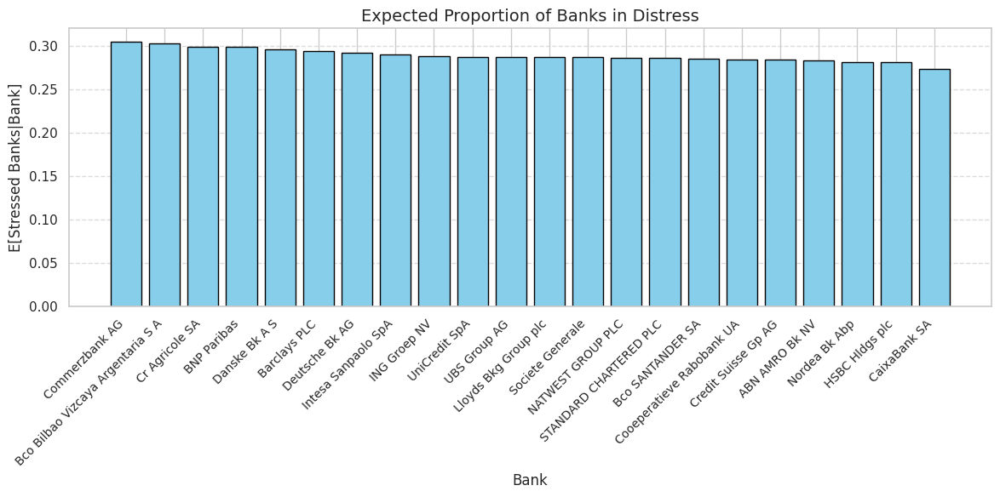

In [ ]:
# an idea of which bank is more systemic

plot_prop_2yr(results_propj_dtd)

### DTP

Mean: 0.5674945648280602
Std: 0.013119004855365976



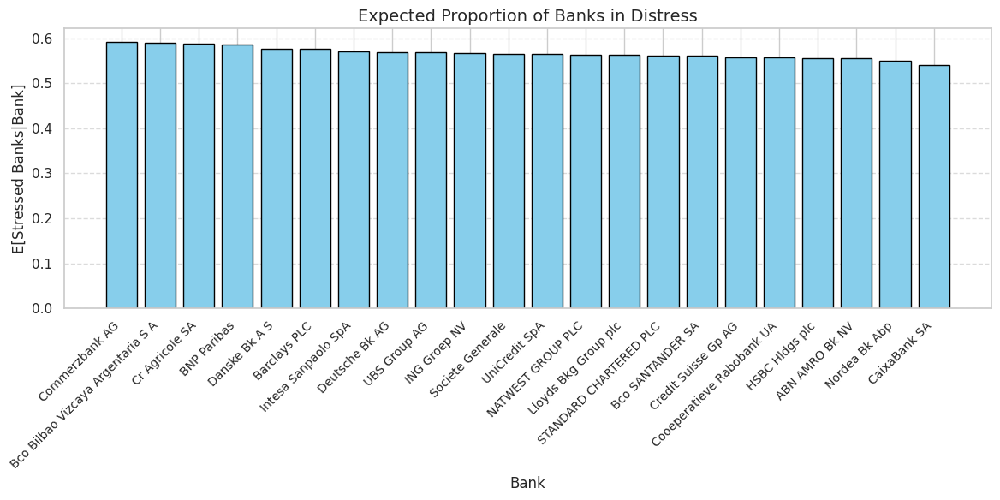

In [ ]:
# an idea of which bank is more systemic

plot_prop_2yr(results_propj_dtp)

# COMPARING TWO YEARS WITH BAYESIAN NETWORKS

## ESTIMATION

In [ ]:
# dividing dataset into 2 periods

data_1 = data[(data["Date"] >= pd.to_datetime("2021-02-01")) & (data["Date"] < pd.to_datetime("2022-02-01"))]
data_2 = data[(data["Date"] >= pd.to_datetime("2022-02-01")) & (data["Date"] <= pd.to_datetime("2023-01-31"))]

data_1 = data_1.drop(columns = ['Date'])
data_2 = data_2.drop(columns = ['Date'])

print(f"Number of data for period 1: {data_1.shape}")
print(f"Number of data for period 2: {data_2.shape}")

Number of data for period 1: (258, 23)
Number of data for period 2: (259, 23)


['CaixaBank SA', 'Nordea Bk Abp', 'Svenska Handelsbanken AB']
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.


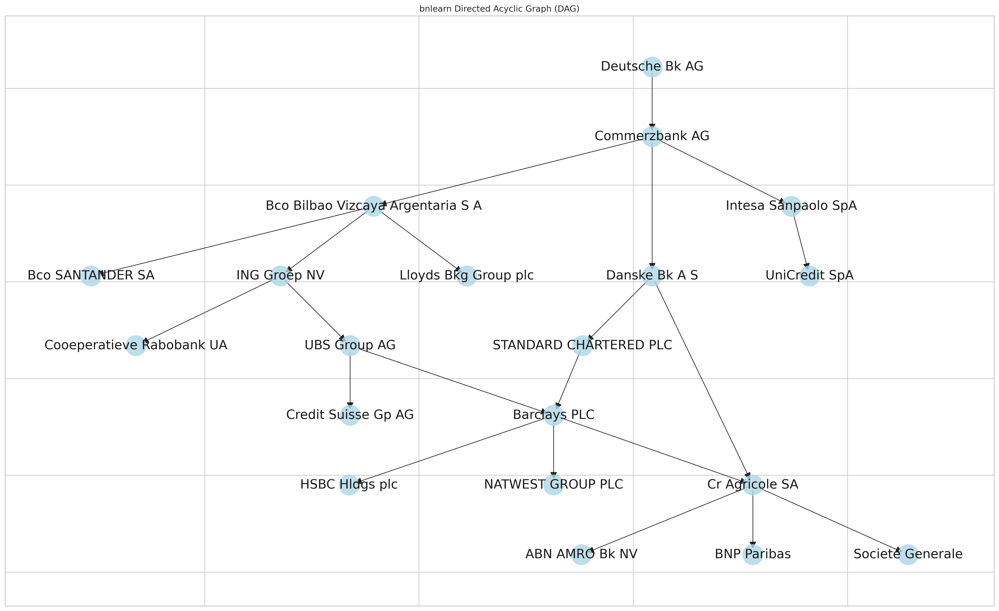

In [ ]:
# Estimating and plotting the first DAG

DAG_1 = bn.structure_learning.fit(data_1, methodtype = 'hc', scoretype = 'bic', verbose = 0)
print(checking_connectdness(DAG_1))
G_1 = bn.plot(DAG_1, params_static = {'figsize': (25,15), 'dpi': 300, 'font_size': 18}, edge_labels = None, verbose = 0)

['All nodes are connected']
[bnlearn] >Set node properties.
[bnlearn] >Set edge properties.


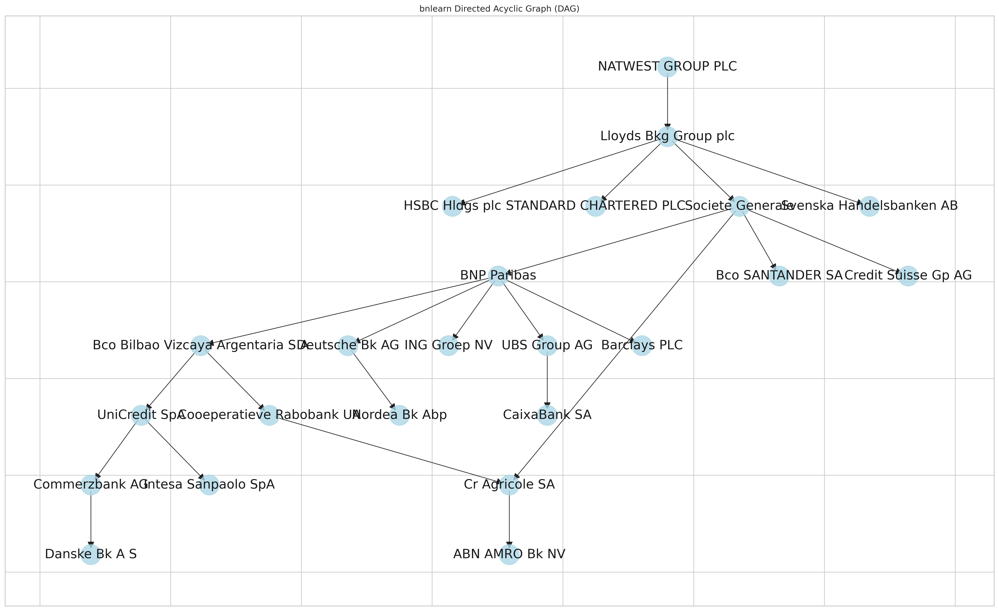

In [ ]:
# Estimating an plotting the second DAG
# Here all nodes are connected
# Probably in the second period there is more variability in the TSs and so all banks
# add info; anyway the three banks excluded before are all leaves

DAG_2 = bn.structure_learning.fit(data_2, methodtype = 'hc', scoretype = 'bic', verbose = 0)
print(checking_connectdness(DAG_2))
G_2 = bn.plot(DAG_2, params_static = {'figsize': (25,15), 'dpi': 300, 'font_size': 18}, edge_labels = None, verbose = 0)

In [ ]:
# Params estimation

print("CPDs for model 1...")
model_1 = bn.parameter_learning.fit(DAG_1, data_1, methodtype = 'bayes', scoretype = 'bdeu', verbose = 0)
print("CPDs for model 2...")
model_2 = bn.parameter_learning.fit(DAG_2, data_2, methodtype = 'bayes', scoretype = 'bdeu', verbose = 0)

CPDs for model 1...
CPDs for model 2...


In [ ]:
# forward sampling

logging.disable(logging.CRITICAL) #ignore it, to avoid useless print

samples_1 = bn.sampling(model_1, n = 10000, methodtype = 'bayes')
samples_2 = bn.sampling(model_2, n = 10000, methodtype = 'bayes')

logging.disable(logging.NOTSET) #ignore it, to avoid useless print

In [ ]:
# saving samples

#samples_1.to_csv('/content/drive/My Drive/samples_1.csv', index = False)
#samples_2.to_csv('/content/drive/My Drive/samples_2.csv', index = False)

samples_1 = pd.read_csv("/content/drive/MyDrive/samples_1.csv")
samples_2 = pd.read_csv("/content/drive/MyDrive/samples_2.csv")

In [ ]:
# Doing the 4 types of inference on both periods (almost 13 mins)

# 1.
# 1.1
results_ij_dtd_1 = inference_ij_dtd(samples_1, "2022-02-01")
results_propj_dtd_1 = inference_propj_dtd(samples_1, "2022-02-01")
# 1.2
results_ij_dtp_1 = inference_ij_dtp(samples_1, "2022-02-01")
results_propj_dtp_1 = inference_propj_dtp(samples_1, "2022-02-01")

# 2.
# 2.1
results_ij_dtd_2 = inference_ij_dtd(samples_2, "2023-01-31")
results_propj_dtd_2 = inference_propj_dtd(samples_2, "2023-01-31")
#2.2
results_ij_dtp_2 = inference_ij_dtp(samples_2, "2023-01-31")
results_propj_dtp_2 = inference_propj_dtp(samples_2, "2023-01-31")

In [ ]:
# Converting to dataframes for convenience

# 1.
results_ij_dtd_1 = pd.DataFrame(results_ij_dtd_1, columns = ['Bank_i', 'Bank_j', 'P(i|j)', 'Date'])
results_ij_dtp_1 = pd.DataFrame(results_ij_dtp_1, columns = ['Bank_i', 'Bank_j', 'P(i|j)', 'Date'])
results_propj_dtd_1 = pd.DataFrame(results_propj_dtd_1, columns = ['Bank', 'E[Stressed Banks|Bank]', 'Date'])
results_propj_dtp_1 = pd.DataFrame(results_propj_dtp_1, columns = ['Bank', 'E[Stressed Banks|Bank]', 'Date'])

# 2.
results_ij_dtd_2 = pd.DataFrame(results_ij_dtd_2, columns = ['Bank_i', 'Bank_j', 'P(i|j)', 'Date'])
results_ij_dtp_2 = pd.DataFrame(results_ij_dtp_2, columns = ['Bank_i', 'Bank_j', 'P(i|j)', 'Date'])
results_propj_dtd_2 = pd.DataFrame(results_propj_dtd_2, columns = ['Bank', 'E[Stressed Banks|Bank]', 'Date'])
results_propj_dtp_2 = pd.DataFrame(results_propj_dtp_2, columns = ['Bank', 'E[Stressed Banks|Bank]', 'Date'])

In [ ]:
# saving for convenience

# 1.
#results_ij_dtd_1.to_csv('/content/drive/My Drive/results_ij_dtd_1.csv', index = False)
#results_ij_dtp_1.to_csv('/content/drive/My Drive/results_ij_dtp_1.csv', index = False)
#results_propj_dtd_1.to_csv('/content/drive/My Drive/results_propj_dtd_1.csv', index = False)
#results_propj_dtp_1.to_csv('/content/drive/My Drive/results_propj_dtp_1.csv', index = False)

results_ij_dtd_1 = pd.read_csv('/content/drive/My Drive/results_ij_dtd_1.csv')
results_ij_dtp_1 = pd.read_csv('/content/drive/My Drive/results_ij_dtp_1.csv')
results_propj_dtd_1 = pd.read_csv('/content/drive/My Drive/results_propj_dtd_1.csv')
results_propj_dtp_1 = pd.read_csv('/content/drive/My Drive/results_propj_dtp_1.csv')

# 2.
#results_ij_dtd_2.to_csv('/content/drive/My Drive/results_ij_dtd_2.csv', index = False)
#results_ij_dtp_2.to_csv('/content/drive/My Drive/results_ij_dtp_2.csv', index = False)
#results_propj_dtd_2.to_csv('/content/drive/My Drive/results_propj_dtd_2.csv', index = False)
#results_propj_dtp_2.to_csv('/content/drive/My Drive/results_propj_dtp_2.csv', index = False)

results_ij_dtd_2 = pd.read_csv('/content/drive/My Drive/results_ij_dtd_2.csv')
results_ij_dtp_2 = pd.read_csv('/content/drive/My Drive/results_ij_dtp_2.csv')
results_propj_dtd_2 = pd.read_csv('/content/drive/My Drive/results_propj_dtd_2.csv')
results_propj_dtp_2 = pd.read_csv('/content/drive/My Drive/results_propj_dtp_2.csv')

# PERIOD 1

## INFERENCE PROBABILITIES

### DTD

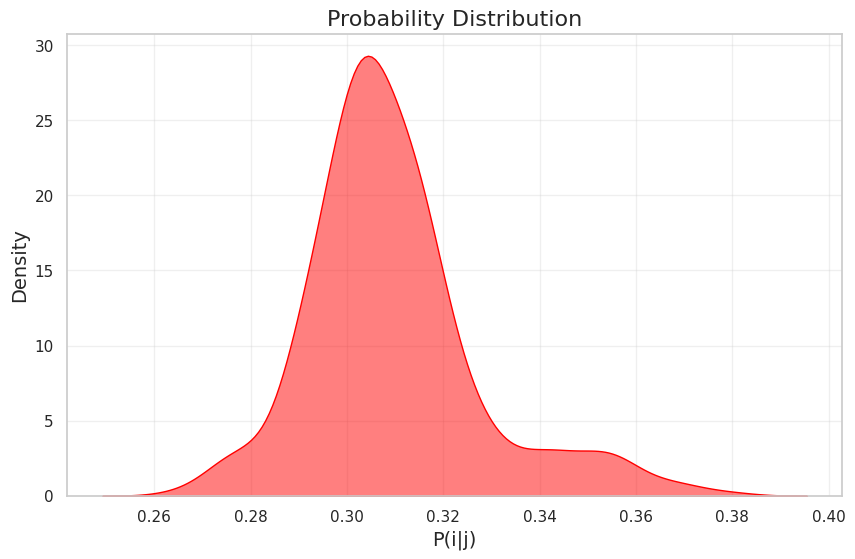

In [ ]:
prob_distr(results_ij_dtd_1)

Mean: 0.30945408593917534
Std Dev: 0.01778481183580665
Std Dev for j: 0.004375974416307058
Std Dev for i: 0.011138007255803248



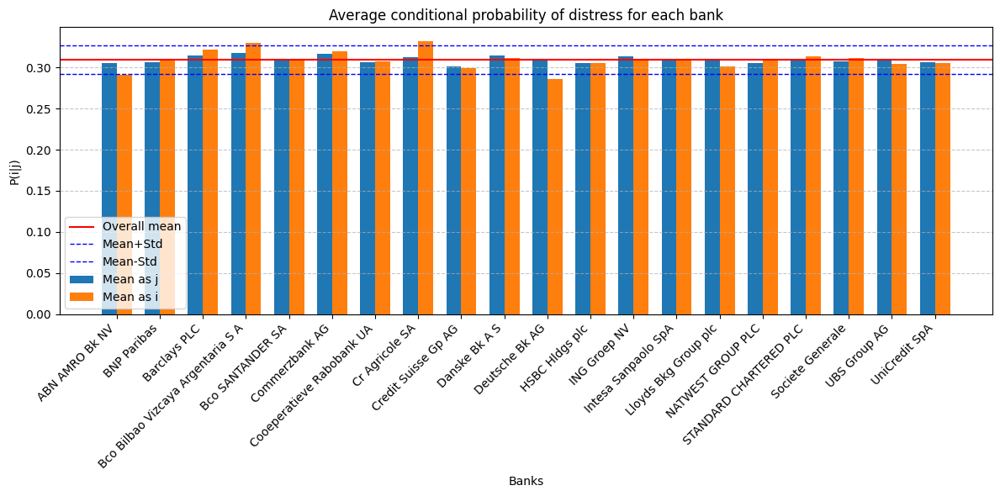

In [ ]:
plot_ij_2yr(results_ij_dtd_1)

### DTP

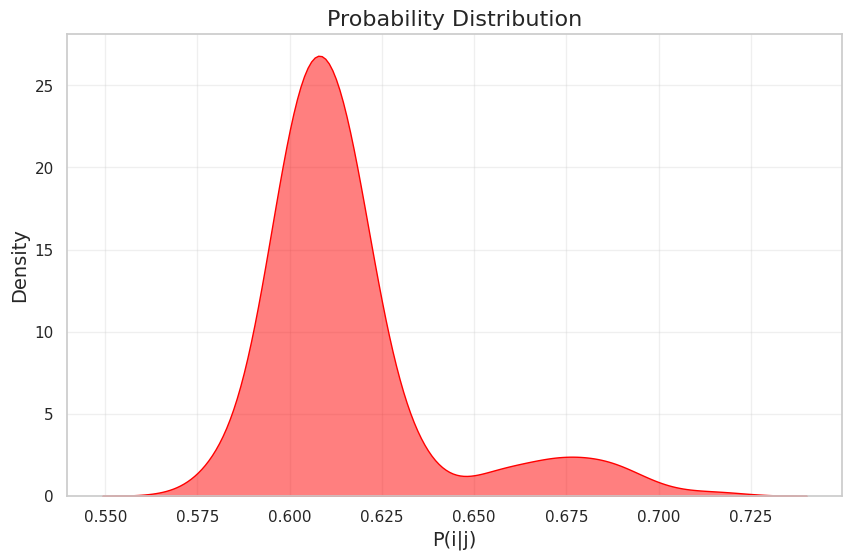

In [ ]:
prob_distr(results_ij_dtp_1)

Mean: 0.6156593817132437
Std Dev: 0.024212682528900725
Std Dev for j: 0.005521594652553905
Std Dev for i: 0.009508918536706979



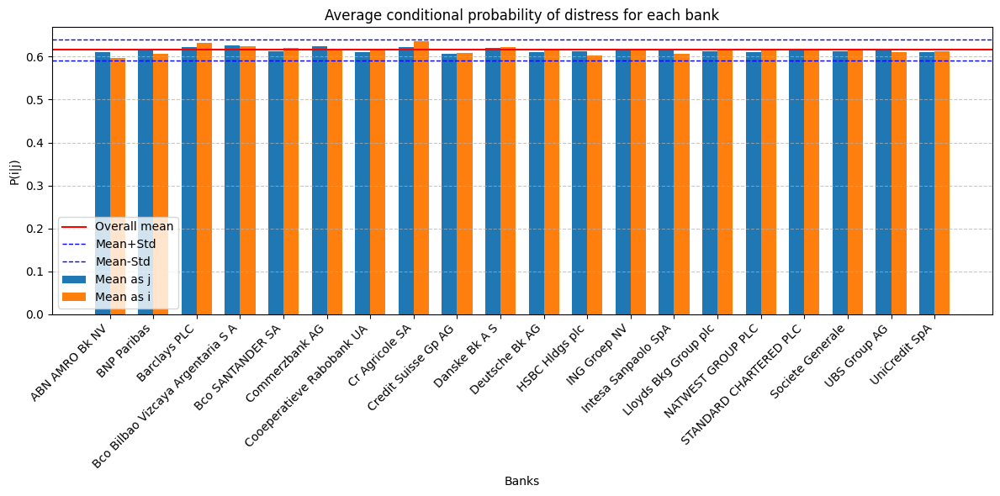

In [ ]:
plot_ij_2yr(results_ij_dtp_1)

## INFERENCE PROPORTIONS

### DTD

Mean: 0.29397369096622306
Std: 0.00415807172569734



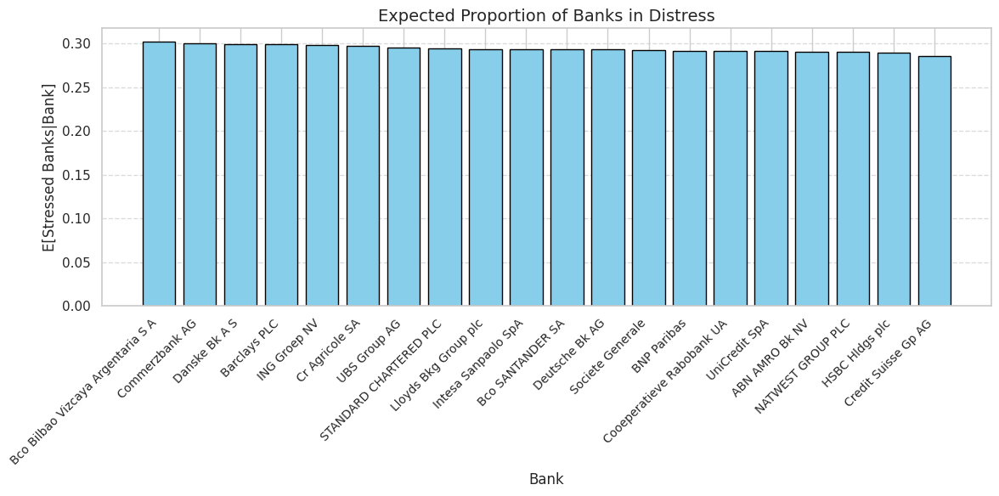

In [ ]:
plot_prop_2yr(results_propj_dtd_1)

### DTP

Mean: 0.5848735966869111
Std: 0.005245781658406112



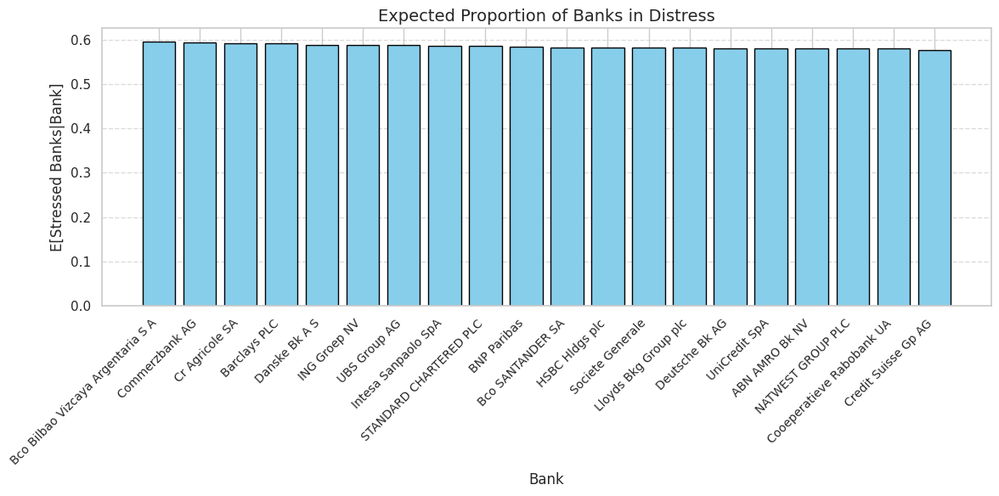

In [ ]:
plot_prop_2yr(results_propj_dtp_1)

# PERIOD 2

## INFERENCE PROBABILITES

### DTD

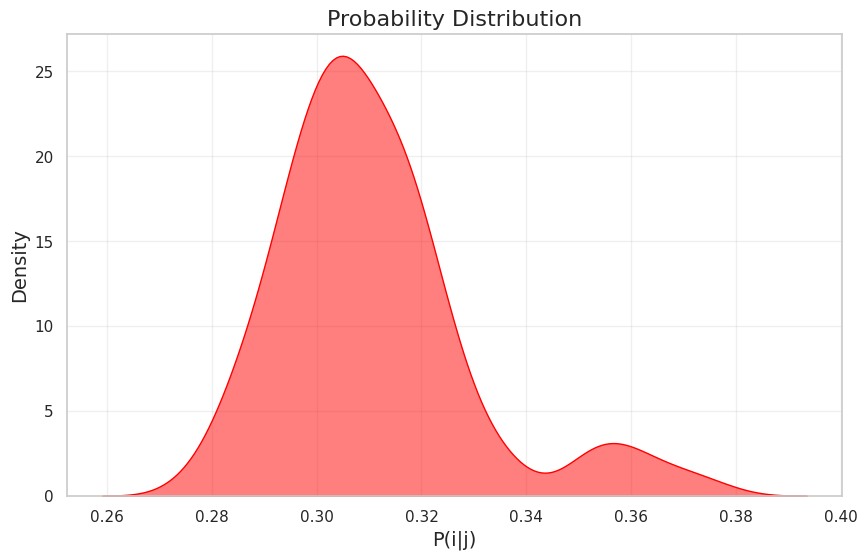

In [ ]:
prob_distr(results_ij_dtd_2)

Mean: 0.3106062024098871
Std Dev: 0.01871219398903563
Std Dev for j: 0.004061451527887016
Std Dev for i: 0.01156570022556276



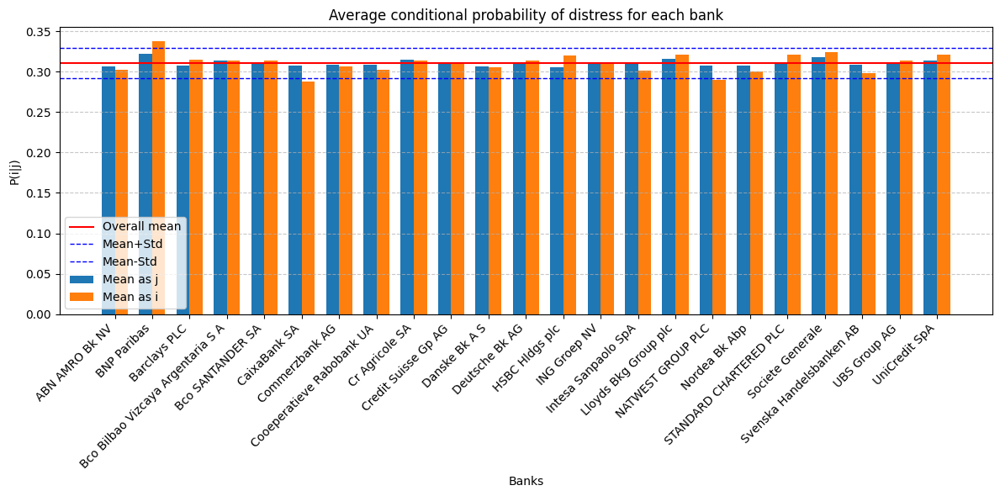

In [ ]:
plot_ij_2yr(results_ij_dtd_2)

### DTP

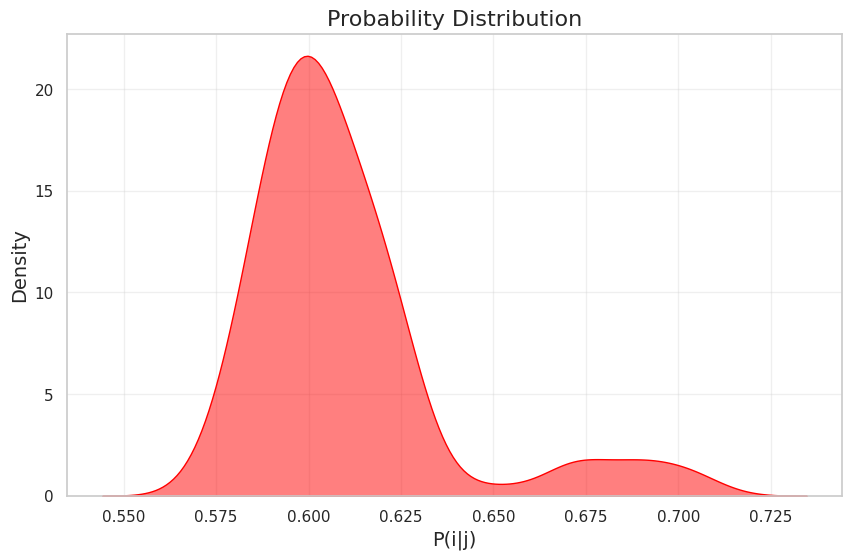

In [ ]:
prob_distr(results_ij_dtp_2)

Mean: 0.6097753638311487
Std Dev: 0.02708109573512496
Std Dev for j: 0.0065201892130511
Std Dev for i: 0.012685219011233461



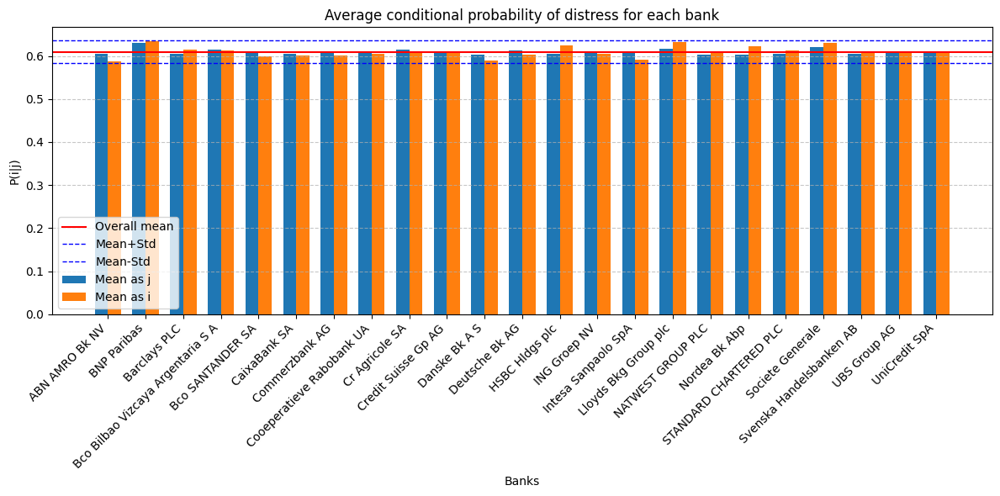

In [ ]:
plot_ij_2yr(results_ij_dtp_2)

## INFERENCE PROPORTIONS

### DTD

Mean: 0.2971080825069631
Std: 0.0038845346695258113



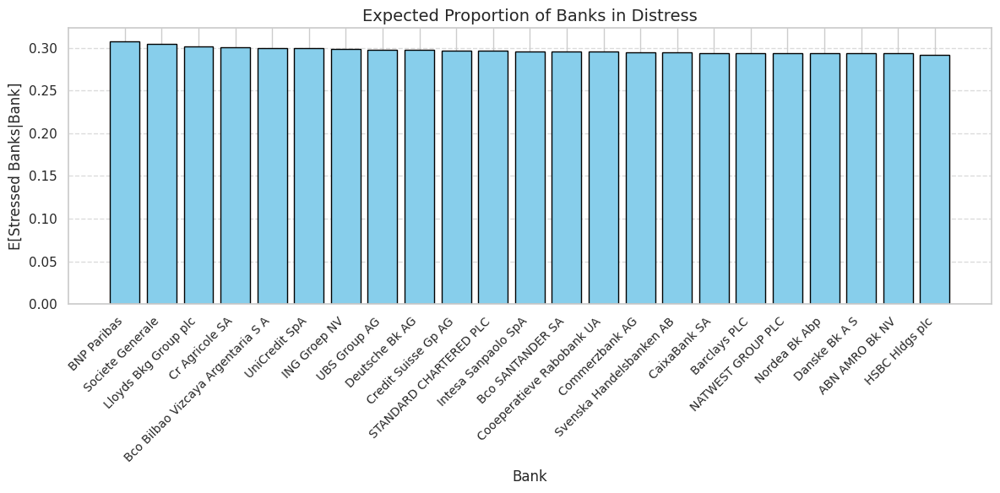

In [ ]:
plot_prop_2yr(results_propj_dtd_2)

### DTP

Mean: 0.5832664350626142
Std: 0.006236327540025076



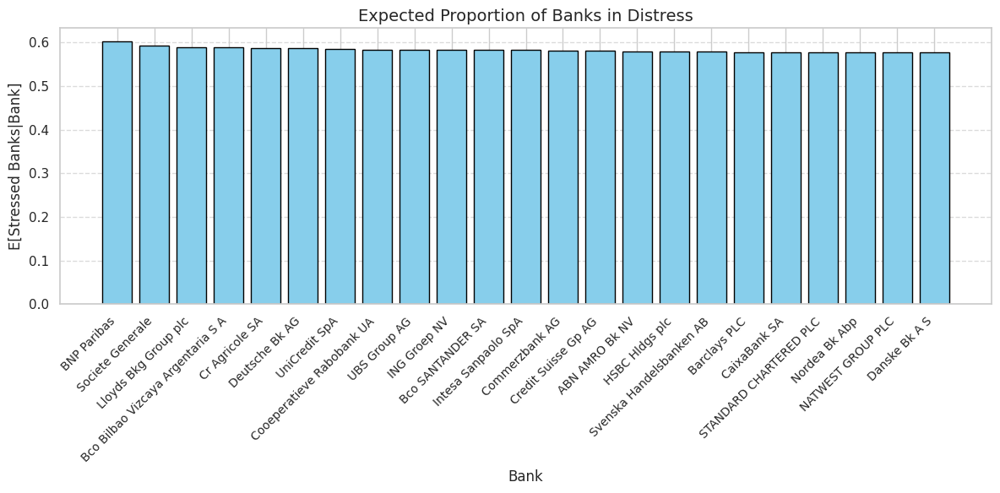

In [ ]:
plot_prop_2yr(results_propj_dtp_2)

#BAYESIAN NETOWRK - ROLLING WINDOW

## ESTIMATION

In [ ]:
# First function for BN

def split_into_semester(dataframe):

  """
  Dividing the whole dataframe into semester dataframes
  """

  start_date = pd.Timestamp('2021-02-01')
  end_date = pd.Timestamp('2023-02-01')
  monthly_ranges = pd.date_range(start = start_date, end = end_date, freq = 'MS') #MS is start of the month

  semester_dataframes = []

  for i in range(len(monthly_ranges)-6):

    start = monthly_ranges[i]
    end = monthly_ranges[i+6]

    group = dataframe[(dataframe['Date'] >= start) & (dataframe['Date'] < end)]

    semester_dataframes.append((group, end-pd.Timedelta(days = 1)))

  return semester_dataframes

In [ ]:
# Second function for BN

def process_semester(semester_data):

    """
    Learning a BN from the semester data
    """

    bm_data, last_date = semester_data
    print(f"Learning the Bayesian Network for the semester that ends this day: {last_date.strftime('%Y-%m-%d')}")

    BN_data = bm_data.iloc[:,1:]  #we do not need the column Date for learning the BN

    # Structure learning
    DAG = bn.structure_learning.fit(BN_data, methodtype = 'hc', scoretype = 'bic', verbose = 0)

    # Disconnected nodes?
    print(checking_connectdness(DAG))

    # Parameter learning
    model = bn.parameter_learning.fit(DAG, BN_data, methodtype = 'bayes', scoretype = 'bdeu', verbose = 0)

    # Forward sampling
    samples = bn.sampling(model, n = 10000, methodtype = 'bayes', verbose = 0)

    return samples, last_date

In [ ]:
# Third function for BN

def rolling_BN(dataframe):

    """
    Computing conditional probabilities
    """

    # 1. Splitting into semesters
    semester_dataframes = split_into_semester(dataframe)

    # 2. Processing every bimester
    results_ij = []
    results_cond = []

    for semester_data in semester_dataframes:

        semester_results, date = process_semester(semester_data)

        # I choose to work only with dtd because:
        # 1. results are more interesting due to higher variability
        # 2. it is simpler

        inference_ij = inference_ij_dtd(semester_results, date)

        inference_cond = inference_propj_dtd(semester_results, date)

        results_ij.extend(inference_ij)
        results_cond.extend(inference_cond)

    # 3. Converting into dataframe
    results_ij_df = pd.DataFrame(results_ij, columns = ['Bank_i', 'Bank_j', 'P(i|j)', 'Date'])
    results_cond_df = pd.DataFrame(results_cond, columns = ['Bank', 'E[Stressed Banks|Bank]', 'Date'])

    results = [results_ij_df, results_cond_df]

    return results

In [ ]:
# Estimating a BN for every bimester in my data (very long to run, 1h 18 mins)

logging.disable(logging.CRITICAL) #ignore it, to avoid useless print

results = rolling_BN(data)

logging.disable(logging.NOTSET) #ignore it, to avoid useless print

Learning the Bayesian Network for the semester that ends this day: 2021-07-31
['CaixaBank SA', 'Svenska Handelsbanken AB']
Learning the Bayesian Network for the semester that ends this day: 2021-08-31
['CaixaBank SA', 'Svenska Handelsbanken AB']
Learning the Bayesian Network for the semester that ends this day: 2021-09-30
['CaixaBank SA', 'HSBC Hldgs plc', 'Svenska Handelsbanken AB']
Learning the Bayesian Network for the semester that ends this day: 2021-10-31
['CaixaBank SA', 'Svenska Handelsbanken AB']
Learning the Bayesian Network for the semester that ends this day: 2021-11-30
['CaixaBank SA', 'Nordea Bk Abp', 'Svenska Handelsbanken AB']
Learning the Bayesian Network for the semester that ends this day: 2021-12-31
['CaixaBank SA', 'Nordea Bk Abp']
Learning the Bayesian Network for the semester that ends this day: 2022-01-31
['CaixaBank SA', 'Nordea Bk Abp', 'Svenska Handelsbanken AB']
Learning the Bayesian Network for the semester that ends this day: 2022-02-28
['CaixaBank SA', 'No

In [ ]:
#condprobs = results[0]
#condprobs.to_csv('/content/drive/My Drive/condprobs.csv', index = False)
condprobs = pd.read_csv("/content/drive/MyDrive/condprobs.csv")

In [ ]:
#condprops = results[1]
#condprops.to_csv('/content/drive/My Drive/condprops.csv', index = False)
condprops = pd.read_csv("/content/drive/MyDrive/condprops.csv")

## INFERENCE PROBABILITIES

In [ ]:
# Ricorda JPD di Oh & Patton
# the data computed

condprobs

,Bank_i,Bank_j,P(i|j),Date
0,Credit Suisse Gp AG,BNP Paribas,0.346324,2021-07-31
1,Barclays PLC,BNP Paribas,0.325412,2021-07-31
2,Cr Agricole SA,BNP Paribas,0.339037,2021-07-31
3,UniCredit SpA,BNP Paribas,0.314639,2021-07-31
4,Bco Bilbao Vizcaya Argentaria S A,BNP Paribas,0.315589,2021-07-31
...,...,...,...,...
8287,Societe Generale,UniCredit SpA,0.307824,2023-01-31
8288,Danske Bk A S,UniCredit SpA,0.321551,2023-01-31
8289,Lloyds Bkg Group plc,UniCredit SpA,0.310570,2023-01-31
8290,UBS Group AG,UniCredit SpA,0.312629,2023-01-31


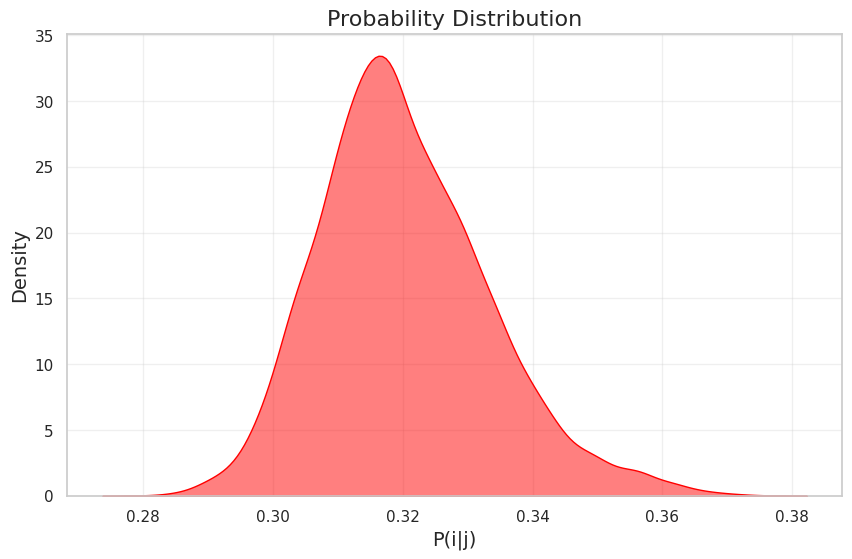

In [ ]:
# to have a general idea

prob_distr(condprobs)

In [ ]:
# Fourth function for BN

def summarize_results(results):

    """
    Results summary
    """

    # Results for each bimester: for each bimester I store the mean prob, the min and the max -> how the systemic risk has changed between 2021-2023?
    bimonthly_stats = results.groupby('Date')['P(i|j)'].agg(['mean', 'std', 'min', 'max']).reset_index()

    # Results for each bank: how the risk of each bank has varied between 2021-2023?
    # Given the stress of th bank, the average of the probabilites of the others' stress?
    bank_stats_sent = results.groupby(['Date', 'Bank_j'])['P(i|j)'].mean().reset_index()
    bank_stats_sent = bank_stats_sent.rename(columns = {'P(i|j)': 'Mean_Stress_Sent'})
    bank_stats_sent = bank_stats_sent.pivot(index = 'Date', columns = 'Bank_j', values = 'Mean_Stress_Sent')

    # Given the stress of the others, the average of the probabilities of the bank's stress?
    bank_stats_received = results.groupby(['Date', 'Bank_i'])['P(i|j)'].mean().reset_index()
    bank_stats_received = bank_stats_received.rename(columns = {'P(i|j)': 'Mean_Stress_Received'})
    bank_stats_received = bank_stats_received.pivot(index = 'Date', columns = 'Bank_i', values = 'Mean_Stress_Received')

    return bimonthly_stats, bank_stats_sent, bank_stats_received

In [ ]:
# Computing stats

bimonthly_stats, bank_stats_sent, bank_stats_received = summarize_results(condprobs)

In [ ]:
# first result, the general one

bimonthly_stats

,Date,mean,std,min,max
0,2021-07-31,0.319265,0.010941,0.291854,0.358562
1,2021-08-31,0.316302,0.009931,0.288505,0.354578
2,2021-09-30,0.316955,0.010513,0.290363,0.354336
3,2021-10-31,0.317370,0.010459,0.295440,0.355061
4,2021-11-30,0.318777,0.011222,0.293629,0.357503
5,2021-12-31,0.314377,0.011550,0.289090,0.348375
6,2022-01-31,0.319547,0.012347,0.287234,0.361785
7,2022-02-28,0.329865,0.011843,0.300936,0.368421
8,2022-03-31,0.326363,0.012496,0.292929,0.369871
9,2022-04-30,0.329776,0.012437,0.301224,0.371517


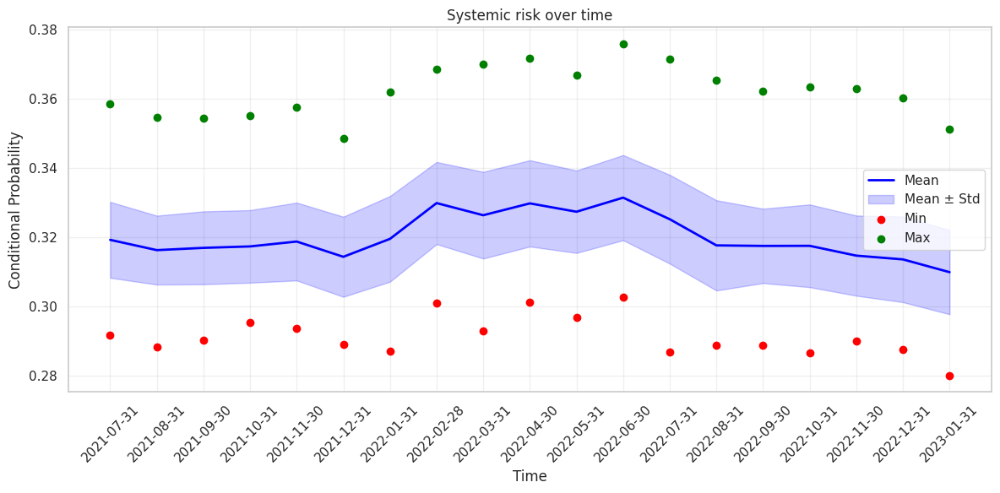

In [ ]:
# plotting general results

x = bimonthly_stats['Date']
x_mean = bimonthly_stats['mean']
x_std = bimonthly_stats['std']
x_min = bimonthly_stats['min']
x_max = bimonthly_stats['max']

plt.figure(figsize = (12,6))

plt.plot(x, x_mean, label = 'Mean', color = 'blue', linewidth = 2)

plt.fill_between(x, x_mean - x_std, x_mean + x_std, color = 'blue', alpha = 0.2, label = 'Mean ± Std')

plt.scatter(x, x_min, label = 'Min', color = 'red', marker = 'o', zorder = 3)
plt.scatter(x, x_max, label = 'Max', color = 'green', marker = 'o', zorder = 3)

plt.xlabel('Time')
plt.ylabel('Conditional Probability')
plt.title('Systemic risk over time')
plt.legend()

plt.xticks(rotation = 45)
plt.grid(alpha = 0.3)
plt.tight_layout()
plt.show()

In [ ]:
# Many NAs in the following tables for some banks

nan_bank = bank_stats_sent.isna().sum()
nan_bank.sort_values(ascending = False)

,0
Bank_j,
Svenska Handelsbanken AB,13
CaixaBank SA,10
Nordea Bk Abp,6
Credit Suisse Gp AG,1
HSBC Hldgs plc,1
ABN AMRO Bk NV,0
ING Groep NV,0
UBS Group AG,0
Societe Generale,0


In [ ]:
# From now on, Svenska, Caixa and Nordea are dropped
# Too many missing values for a sound analysis

bank_stats_sent = bank_stats_sent.drop(columns = ['Svenska Handelsbanken AB',
                                                  'CaixaBank SA',
                                                  'Nordea Bk Abp'])

bank_stats_received = bank_stats_received.drop(columns = ['Svenska Handelsbanken AB',
                                                  'CaixaBank SA',
                                                  'Nordea Bk Abp'])

In [ ]:
# for each bank, the prob that, given its stress, another bank will be distressed
# we fill NAs with avg

bank_stats_sent = bank_stats_sent.apply(lambda x: x.fillna(x.mean()), axis = 0)
bank_stats_sent.head()

Bank_j,ABN AMRO Bk NV,BNP Paribas,Barclays PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,Commerzbank AG,Cooeperatieve Rabobank UA,Cr Agricole SA,Credit Suisse Gp AG,Danske Bk A S,Deutsche Bk AG,HSBC Hldgs plc,ING Groep NV,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,NATWEST GROUP PLC,STANDARD CHARTERED PLC,Societe Generale,UBS Group AG,UniCredit SpA
Date,,,,,,,,,,,,,,,,,,,,
2021-07-31,0.318074,0.319962,0.321058,0.320539,0.319018,0.323030,0.321640,0.319957,0.318209,0.317068,0.318934,0.318180,0.319227,0.316677,0.319777,0.314672,0.320436,0.317688,0.322485,0.319205
2021-08-31,0.317354,0.317627,0.317874,0.318930,0.316467,0.316153,0.314641,0.317748,0.317926,0.315554,0.313666,0.315214,0.314449,0.317295,0.317469,0.314481,0.314104,0.318851,0.316235,0.313048
2021-09-30,0.314467,0.316121,0.318477,0.320056,0.314997,0.319370,0.313550,0.318547,0.314769,0.319109,0.314099,0.319487,0.317025,0.316555,0.317362,0.319356,0.315855,0.317635,0.317978,0.317310
2021-10-31,0.318380,0.319514,0.320928,0.317434,0.314392,0.320668,0.316923,0.318090,0.315062,0.316385,0.316481,0.317722,0.314732,0.317543,0.314881,0.317119,0.316640,0.317549,0.320149,0.318263
2021-11-30,0.318458,0.318693,0.324026,0.314662,0.316160,0.322560,0.317481,0.320601,0.316284,0.321639,0.320769,0.317785,0.320029,0.314331,0.315738,0.317345,0.321115,0.318739,0.319136,0.319994


In [ ]:
# for each bank, the prob that, given another bank's stress, it will be in distress

bank_stats_received = bank_stats_received.apply(lambda x: x.fillna(x.mean()), axis = 0) #same thing of above
bank_stats_received.head()

Bank_i,ABN AMRO Bk NV,BNP Paribas,Barclays PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,Commerzbank AG,Cooeperatieve Rabobank UA,Cr Agricole SA,Credit Suisse Gp AG,Danske Bk A S,Deutsche Bk AG,HSBC Hldgs plc,ING Groep NV,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,NATWEST GROUP PLC,STANDARD CHARTERED PLC,Societe Generale,UBS Group AG,UniCredit SpA
Date,,,,,,,,,,,,,,,,,,,,
2021-07-31,0.308585,0.318595,0.326682,0.322686,0.307008,0.320658,0.318568,0.330922,0.314403,0.315874,0.329001,0.317132,0.320751,0.328594,0.326326,0.314347,0.324761,0.312230,0.314142,0.319302
2021-08-31,0.313807,0.317700,0.312620,0.321890,0.319391,0.313491,0.315970,0.320047,0.313335,0.316316,0.318247,0.309598,0.314755,0.313357,0.306266,0.319508,0.318363,0.328327,0.322992,0.311307
2021-09-30,0.309462,0.318912,0.310270,0.315478,0.311968,0.321858,0.318160,0.320295,0.314143,0.314384,0.319725,0.322209,0.312453,0.324957,0.309635,0.324762,0.321143,0.325156,0.315207,0.320731
2021-10-31,0.312052,0.307900,0.317987,0.321535,0.306485,0.324695,0.314025,0.319037,0.316487,0.320778,0.324039,0.311574,0.321116,0.331969,0.319994,0.318488,0.307685,0.313715,0.319167,0.321538
2021-11-30,0.314528,0.320680,0.321701,0.316899,0.313186,0.326222,0.316416,0.330887,0.320788,0.328045,0.312443,0.316285,0.321440,0.324302,0.308756,0.316585,0.316802,0.326904,0.313232,0.309446


In [ ]:
# plotting for each bank the average prob sent, received and the mean (DA CAPIRE SE TENERE MEAN)

for bank in bank_stats_sent.columns:

    plt.figure(figsize = (12,8))

    plt.plot(bank_stats_sent.index, bank_stats_sent[bank], label = f'{bank} Stress Sent', marker = 'o', linestyle = '-')
    plt.plot(bank_stats_received.index, bank_stats_received[bank], label=f'{bank} Stress Received', marker= 'o' , linestyle = '-')

    # Mean computed above
    plt.plot(bimonthly_stats['Date'], bimonthly_stats['mean'], label = 'Mean', marker = 'o', linestyle = '-', color = 'purple')

    plt.title(f'Systemic Risk over time: focus on {bank}', fontsize = 16)
    plt.xlabel('Date', fontsize = 14)
    plt.ylabel('Probability', fontsize = 14)
    plt.xticks(rotation = 45)
    plt.legend(fontsize = 12)
    plt.grid(True, linestyle = '--', alpha = 0.6)

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Visualizing a summary of the results

comparison_summary = []

for bank in bank_stats_sent.columns:

    sent_stress = (bank_stats_sent[bank] > bank_stats_received[bank]).sum() #1 if greater, 0 otherwise
    received_stress = len(bank_stats_sent) - sent_stress
    net_difference = sent_stress - received_stress

    comparison_summary.append({
        'Bank': bank,
        'Sent > Received': sent_stress,
        'Received > Sent': received_stress,
        'Net Stress': net_difference
    })

comparison_summary = pd.DataFrame(comparison_summary).sort_values(by = 'Net Stress', ascending = False)
comparison_summary

,Bank,Sent > Received,Received > Sent,Net Stress
0,ABN AMRO Bk NV,17,2,15
19,UniCredit SpA,14,5,9
2,Barclays PLC,13,6,7
18,UBS Group AG,10,9,1
9,Danske Bk A S,9,10,-1
5,Commerzbank AG,9,10,-1
6,Cooeperatieve Rabobank UA,9,10,-1
15,NATWEST GROUP PLC,9,10,-1
13,Intesa Sanpaolo SpA,8,11,-3
11,HSBC Hldgs plc,8,11,-3


In [ ]:
# which is the most "representative" bank for the systemic risk?

mean_sent = bank_stats_sent.mean(axis = 1) #mean for every row (date)
mean_received = bank_stats_received.mean(axis = 1)

similarity_scores = []

for bank in bank_stats_sent.columns:

    sent_distance_squared = np.mean((bank_stats_sent[bank] - mean_sent) ** 2)
    received_distance_squared = np.mean((bank_stats_received[bank] - mean_received) ** 2)

    sent_distance = np.sqrt(sent_distance_squared)
    received_distance = np.sqrt(received_distance_squared)

    # I create a dictionary to append to track the results for each bank
    similarity_scores.append({
        'Bank': bank,
        'Sent Stress Distance': sent_distance,
        'Received Stress Distance': received_distance,
        'Total Distance': sent_distance + received_distance
    })

similarity_scores_df = pd.DataFrame(similarity_scores).sort_values(by = 'Total Distance', ascending = False)

similarity_scores_df

,Bank,Sent Stress Distance,Received Stress Distance,Total Distance
0,ABN AMRO Bk NV,0.001747,0.010144,0.011891
1,BNP Paribas,0.003330,0.007658,0.010987
9,Danske Bk A S,0.003195,0.007353,0.010548
14,Lloyds Bkg Group plc,0.001976,0.007990,0.009966
13,Intesa Sanpaolo SpA,0.002158,0.007747,0.009905
5,Commerzbank AG,0.002874,0.006891,0.009765
4,Bco SANTANDER SA,0.002135,0.007407,0.009542
12,ING Groep NV,0.001967,0.006924,0.008890
11,HSBC Hldgs plc,0.001554,0.007263,0.008816
3,Bco Bilbao Vizcaya Argentaria S A,0.002759,0.005860,0.008619


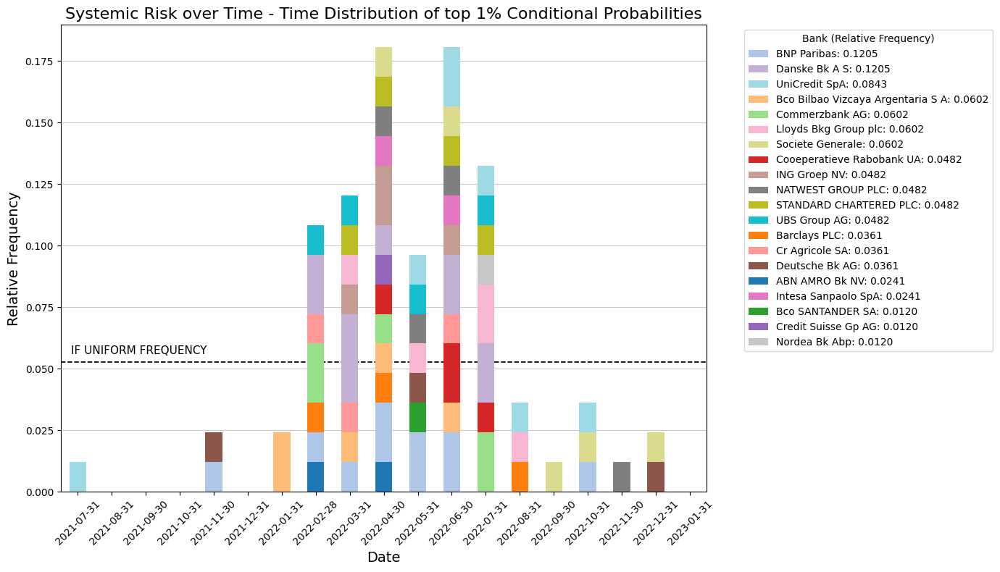

In [ ]:
# At the beginning, I could have just computed the avg prob for each bank for each semester
# and rank banks accordingly to discover which is the most systemic. It seemed to me
# difficult to summarize and plot this info.
# I think the following plot is more interesting.

# Computing top 1% probs
top_percentile_threshold = condprobs['P(i|j)'].quantile(0.99)  #threshold
top_percentile = condprobs[condprobs['P(i|j)'] > top_percentile_threshold] #collection

# Count for each (bank, date) how many high probs
bank_contributions = top_percentile.groupby(['Date','Bank_j']).size().reset_index(name = 'Count')

# For each date how many high probs
total_top_per_date = top_percentile.groupby('Date').size().reset_index(name = 'TotalTop')

# Create a summary of all dates in condprobs, merging with total_top_per_date
dates_summary = condprobs[['Date']].drop_duplicates().sort_values('Date')
dates_summary = dates_summary.merge(total_top_per_date, on = 'Date', how = 'left').fillna(0)

# Merging with bank info
bank_contributions = bank_contributions.merge(dates_summary['Date'], on = 'Date', how = 'left')
pivot_data = bank_contributions.pivot(index = 'Date', columns = 'Bank_j', values = 'Count').fillna(0)

# To compute how much prob for each bank for each date -> .div() divide each value for the len()
pivot_data_freq = pivot_data.div(len(top_percentile), axis = 0)

# Adding the dates for which there is no high prob
pivot_data_full = pivot_data_freq.reindex(dates_summary['Date'], fill_value = 0)

# Computing the total relative frequency for each bank
total_relative_frequencies = pivot_data_full.sum(axis = 0).sort_values(ascending = False)

# A convenient way to have the total freq in the legend -> adding the, in the column names
new_column_names = {
    bank: f"{bank}: {total_relative_frequencies[bank]:.4f}"
    for bank in total_relative_frequencies.index
}
pivot_data_renamed = pivot_data_full.rename(columns=new_column_names)

# Uniform distribution line
uniform_frequency = 1 / len(dates_summary)

# Plot the graph
fig, ax = plt.subplots(figsize = (14,8))

# Draw the horizontal line behind the bars
ax.axhline(y = uniform_frequency, color = 'black', linestyle = '--', linewidth = 1.25, label = f"Uniform frequency ({uniform_frequency:.4f})", zorder = 0)

# Add the label next to the line indicating uniform frequency
ax.text(
    x = len(dates_summary['Date']) * 0.2,  # Place it near the left side of the plot
    y = uniform_frequency + 0.0025,  # Slightly above the line
    s = "IF UNIFORM FREQUENCY",
    color = 'black', fontsize = 11, ha = 'right', va = 'bottom'  # Adjust position and font
)

# Draw the stacked bar chart
pivot_data_renamed.plot(kind = 'bar', stacked = True, ax = ax, cmap = 'tab20', zorder = 2)

# Customize the plot
ax.set_title('Systemic Risk over Time - Time Distribution of top 1% Conditional Probabilities', fontsize = 16)
ax.set_xlabel('Date', fontsize = 14)
ax.set_ylabel('Relative Frequency', fontsize = 14)
ax.set_xticks(range(len(dates_summary['Date'])))
ax.set_xticklabels(dates_summary['Date'], rotation = 45, fontsize = 10)

# Reorganize the legend to show banks in descending order of total relative frequency
handles, labels = ax.get_legend_handles_labels()

# Filter valid labels
labels = [
    (handle, label) for handle, label in zip(handles, labels)
    if ': ' in label
]

# Sort valid labels by relative frequency
sorted_legend = sorted(
    labels,
    key = lambda x: float(x[1].split(': ')[1]),  # Sort by relative frequency
    reverse = True
)

# Update the legend
sorted_handles, sorted_labels = zip(*sorted_legend)
ax.legend(sorted_handles, sorted_labels, title = 'Bank (Relative Frequency)', bbox_to_anchor = (1.05,1), loc = 'upper left', fontsize = 10)

plt.tight_layout()
plt.grid(axis = 'y', linestyle = '-', alpha = 0.7)
plt.show()

## INFERENCE PROPORTION

In [ ]:
# EXPECTED PROPORTION IN DISTRESS, Oh & Patton
# se EPD alto per una banca, segnale di widespread distress

condprops

,Bank,E[Stressed Banks|Bank],Date
0,BNP Paribas,0.304726,2021-07-31
1,Credit Suisse Gp AG,0.303051,2021-07-31
2,Barclays PLC,0.305764,2021-07-31
3,Cr Agricole SA,0.304715,2021-07-31
4,UniCredit SpA,0.304005,2021-07-31
...,...,...,...
401,Danske Bk A S,0.291962,2023-01-31
402,Lloyds Bkg Group plc,0.295976,2023-01-31
403,UBS Group AG,0.292470,2023-01-31
404,ABN AMRO Bk NV,0.293891,2023-01-31


In [ ]:
def cond_mean(results):

    # To plot the TS
    bimonthly_stats = results.groupby('Date')['E[Stressed Banks|Bank]'].agg(['mean', 'std', 'min', 'max']).reset_index()

    return bimonthly_stats

In [ ]:
# calling the function

cond_bimonthly_stats = cond_mean(condprops)
cond_bimonthly_stats

,Date,mean,std,min,max
0,2021-07-31,0.304060,0.001867,0.299687,0.307648
1,2021-08-31,0.301251,0.001657,0.298141,0.303767
2,2021-09-30,0.301098,0.001814,0.297872,0.304053
3,2021-10-31,0.302267,0.001790,0.299421,0.305670
4,2021-11-30,0.302844,0.002482,0.298630,0.307825
5,2021-12-31,0.299399,0.001805,0.295750,0.302923
6,2022-01-31,0.303584,0.002172,0.300155,0.308347
7,2022-02-28,0.313371,0.002542,0.310251,0.321045
8,2022-03-31,0.311519,0.002585,0.308210,0.317703
9,2022-04-30,0.314782,0.001882,0.312179,0.318375


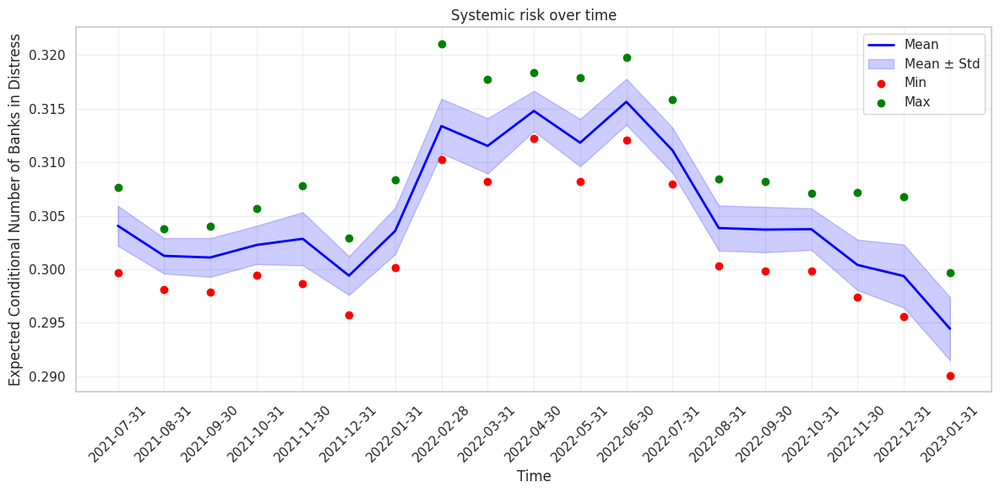

In [ ]:
# plotting general results

cond_x = cond_bimonthly_stats['Date']
cond_x_mean = cond_bimonthly_stats['mean']
cond_x_std = cond_bimonthly_stats['std']
cond_x_min = cond_bimonthly_stats['min']
cond_x_max = cond_bimonthly_stats['max']

plt.figure(figsize = (12,6))

plt.plot(cond_x, cond_x_mean, label = 'Mean', color = 'blue', linewidth = 2)

plt.fill_between(cond_x, cond_x_mean - cond_x_std, cond_x_mean + cond_x_std, color = 'blue', alpha = 0.2, label = 'Mean ± Std')

plt.scatter(cond_x, cond_x_min, label = 'Min', color = 'red', marker = 'o', zorder = 3)
plt.scatter(cond_x, cond_x_max, label = 'Max', color = 'green', marker = 'o', zorder = 3)

plt.xlabel('Time')
plt.ylabel('Expected Conditional Number of Banks in Distress')
plt.title('Systemic risk over time')
plt.legend()

plt.xticks(rotation=45)
plt.grid(alpha = 0.3)
plt.tight_layout()
plt.show()

In [ ]:
# pivot to better visualize the data

bank_cond = condprops.pivot(index = 'Date', columns = 'Bank', values = 'E[Stressed Banks|Bank]')
bank_cond = bank_cond.drop(columns = ['Svenska Handelsbanken AB',
                                                  'CaixaBank SA',
                                                  'Nordea Bk Abp'])
bank_cond = bank_cond.apply(lambda x: x.fillna(x.mean()), axis = 0) #same NaNs
bank_cond.head()

Bank,ABN AMRO Bk NV,BNP Paribas,Barclays PLC,Bco Bilbao Vizcaya Argentaria S A,Bco SANTANDER SA,Commerzbank AG,Cooeperatieve Rabobank UA,Cr Agricole SA,Credit Suisse Gp AG,Danske Bk A S,Deutsche Bk AG,HSBC Hldgs plc,ING Groep NV,Intesa Sanpaolo SpA,Lloyds Bkg Group plc,NATWEST GROUP PLC,STANDARD CHARTERED PLC,Societe Generale,UBS Group AG,UniCredit SpA
Date,,,,,,,,,,,,,,,,,,,,
2021-07-31,0.302928,0.304726,0.305764,0.305269,0.303821,0.307648,0.306317,0.304715,0.303051,0.301969,0.303746,0.303029,0.304026,0.301597,0.304550,0.299687,0.305171,0.302560,0.307128,0.304005
2021-08-31,0.302241,0.302527,0.302738,0.303767,0.301397,0.301124,0.299659,0.302617,0.302812,0.300528,0.298756,0.300230,0.299502,0.302186,0.302377,0.299505,0.299146,0.303691,0.301176,0.298141
2021-09-30,0.298744,0.300315,0.302553,0.304053,0.299248,0.303402,0.297872,0.302620,0.298983,0.303153,0.298394,0.304555,0.301174,0.300727,0.301494,0.303341,0.300062,0.301706,0.302079,0.301397
2021-10-31,0.303244,0.304324,0.305670,0.302343,0.299421,0.305398,0.301831,0.302967,0.300084,0.301319,0.301435,0.302593,0.299745,0.302446,0.299887,0.302043,0.301561,0.302428,0.304904,0.303108
2021-11-30,0.302551,0.302773,0.307825,0.298929,0.300352,0.306432,0.301607,0.304571,0.300485,0.305571,0.304730,0.301896,0.304042,0.298630,0.299951,0.301493,0.305059,0.302816,0.303179,0.303995


In [ ]:
# plotting

for bank in bank_cond.columns:

    plt.figure(figsize = (12,8))

    plt.plot(bank_cond.index, bank_cond[bank], label=f'{bank} Expected Condition Bank in Distress', marker = 'o', linestyle = '-')

    # Mean computed above
    plt.plot(cond_bimonthly_stats['Date'], cond_bimonthly_stats['mean'], label = 'Mean', marker = 'o', linestyle = '-', color = 'purple')

    plt.title(f'Systemic Risk over time: focus on {bank}', fontsize = 16)
    plt.xlabel('Date', fontsize = 14)
    plt.ylabel('Proportion', fontsize = 14)
    plt.xticks(rotation = 45)
    plt.legend(fontsize = 12)
    plt.grid(True, linestyle = '--', alpha = 0.6)

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# which is the most "representative" bank for the systemic risk?

mean_cond = bank_cond.mean(axis = 1) #mean for every row (date)

cond_similarity_scores = []

for bank in bank_cond.columns:

    cond_distance_squared = np.mean((bank_cond[bank] - mean_cond) ** 2)

    cond_distance = np.sqrt(cond_distance_squared)

    # I create a dictionary to append to track the results for each bank
    cond_similarity_scores.append({
        'Bank': bank,
        'Distance': cond_distance
    })

cond_similarity_scores_df = pd.DataFrame(cond_similarity_scores).sort_values(by = 'Distance', ascending = False)

cond_similarity_scores_df

,Bank,Distance
1,BNP Paribas,0.003178
8,Credit Suisse Gp AG,0.003109
9,Danske Bk A S,0.003047
5,Commerzbank AG,0.002730
3,Bco Bilbao Vizcaya Argentaria S A,0.002625
6,Cooeperatieve Rabobank UA,0.002288
2,Barclays PLC,0.002119
13,Intesa Sanpaolo SpA,0.002059
15,NATWEST GROUP PLC,0.002056
4,Bco SANTANDER SA,0.002042
